In [15]:
#pip install numpy matplotlib pandas scikit-learn geopandas scipy

# Preliminaries

## Import library

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from matplotlib.tri import Triangulation
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances
import geopandas as gpd
from scipy.spatial import Delaunay

## Read input data

In [17]:
DATA_DIR = "../data/Typhoon"
FATA_NAME = "Tracks.2020-12.DOLPHIN.csv"
df_input = pd.read_csv(f"{DATA_DIR}/{FATA_NAME}", header=0, sep=";", skiprows=0)
df_input

,InitializationTime,ForecastTime,Horizon,Member,type,lon,lat,X,Y,prmsl,X1,Y1,Xs,Ys,id1,id2
0,2020-09-20 12:00:00,2020-09-20 12:00:00,0,0,Unperturbed,134.02,24.04,4.003495e+05,2.659003e+06,100583.734375,0.000000,0.000000,-1.338151,-1.672546,20200920120000_20200920133000_00,01_01_00
1,2020-09-20 12:00:00,2020-09-20 15:00:00,3,0,Unperturbed,133.75,24.62,3.734719e+05,2.723442e+06,100442.109375,-0.308428,0.515353,-1.404047,-1.567601,20200920120000_20200920163000_00,01_02_00
2,2020-09-20 12:00:00,2020-09-20 18:00:00,6,0,Unperturbed,133.46,24.72,3.442297e+05,2.734824e+06,100236.843750,-0.643991,0.606384,-1.475740,-1.549063,20200920120000_20200920193000_00,01_03_00
3,2020-09-20 12:00:00,2020-09-20 21:00:00,9,0,Unperturbed,133.56,24.67,3.542884e+05,2.729174e+06,100252.906250,-0.528565,0.561196,-1.451079,-1.558265,20200920120000_20200920223000_00,01_04_00
4,2020-09-20 12:00:00,2020-09-21 00:00:00,12,0,Unperturbed,133.71,24.80,3.696176e+05,2.743412e+06,100248.265625,-0.352657,0.675066,-1.413496,-1.535077,20200920120000_20200921013000_00,01_05_00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6463,2020-09-25 18:00:00,2020-09-26 21:00:00,27,20,Perturbed,147.03,43.55,1.472091e+06,4.892749e+06,100120.859375,15.593206,12.480294,1.289449,1.965347,20200925180000_20200926223000_20,22_10_20
6464,2020-09-25 18:00:00,2020-09-27 00:00:00,30,20,Perturbed,147.65,44.19,1.511152e+06,4.971422e+06,100155.468750,16.161530,12.919853,1.385216,2.093474,20200925180000_20200927013000_20,22_11_20
6465,2020-09-25 18:00:00,2020-09-27 03:00:00,33,20,Perturbed,146.81,45.45,1.423357e+06,5.101242e+06,99995.492188,14.884157,13.645179,1.169969,2.304900,20200925180000_20200927043000_20,22_12_20
6466,2020-09-25 18:00:00,2020-09-27 06:00:00,36,20,Perturbed,146.87,46.04,1.418180e+06,5.167432e+06,99812.023438,14.808828,14.014991,1.157275,2.412697,20200925180000_20200927073000_20,22_13_20


In [18]:
print("Start InitializationTime\t%s" % df_input["InitializationTime"].loc[0])
print("End InitializationTime\t%s" % df_input["InitializationTime"].values[-1])
print("#InitializationTime\t%d" % len(np.unique(df_input["InitializationTime"].values)))
print("#ForecastTime\t%d" % len(np.unique(df_input["ForecastTime"].values)))
print("#Ensemble\t%d" % len(np.unique(df_input["Member"].values)))

Start InitializationTime	2020-09-20 12:00:00
End InitializationTime	2020-09-25 18:00:00
#InitializationTime	22
#ForecastTime	56
#Ensemble	21


## Set index of sequence

In [34]:
df_input_tmp = df_input.set_index(['InitializationTime', 'Member'])
df_input['group_id'] = pd.factorize(df_input_tmp.index)[0]

## Visualization of Input Data

<Figure size 800x800 with 0 Axes>

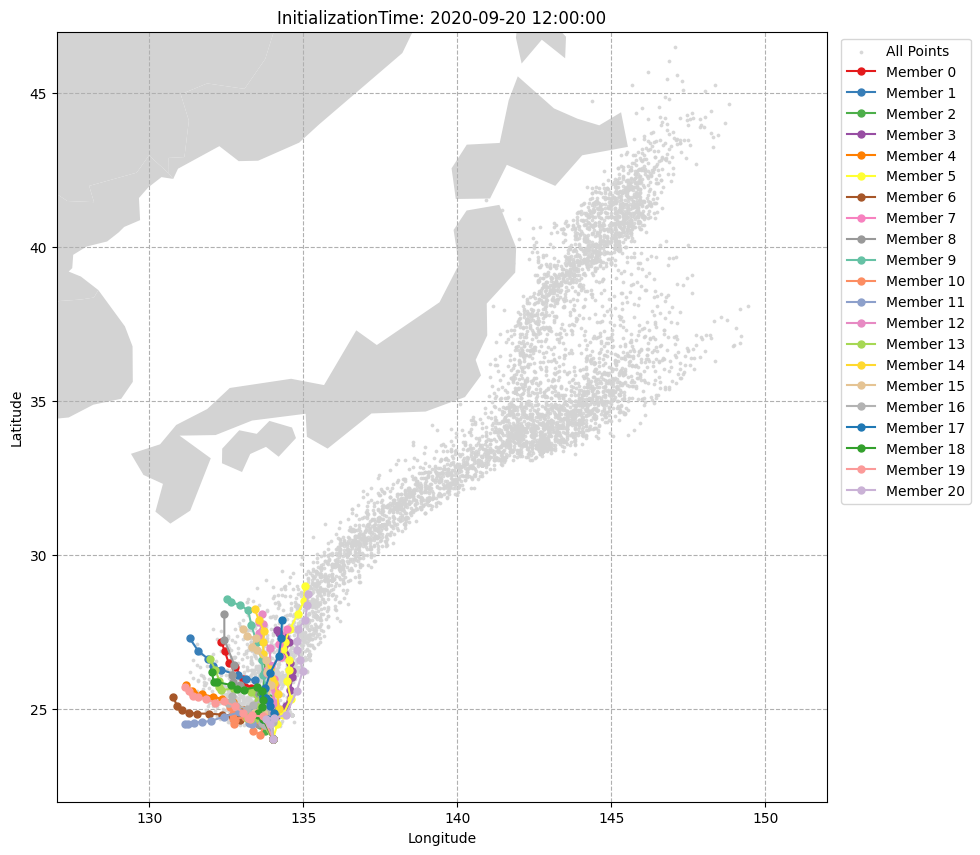

<Figure size 800x800 with 0 Axes>

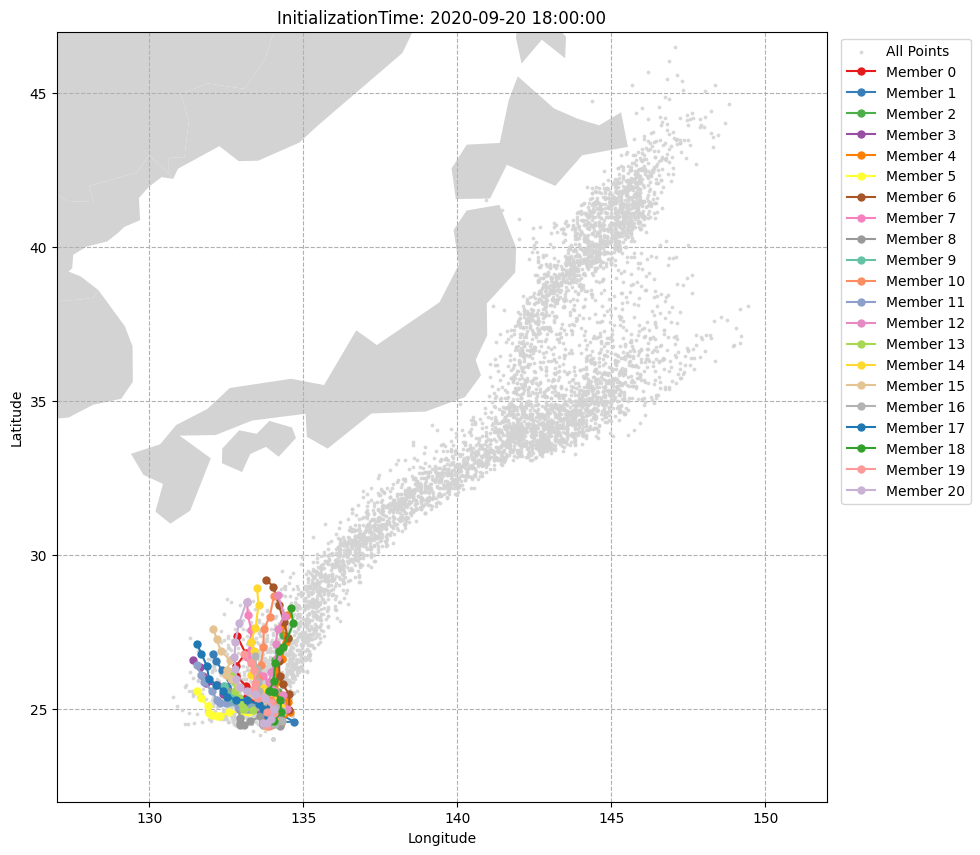

<Figure size 800x800 with 0 Axes>

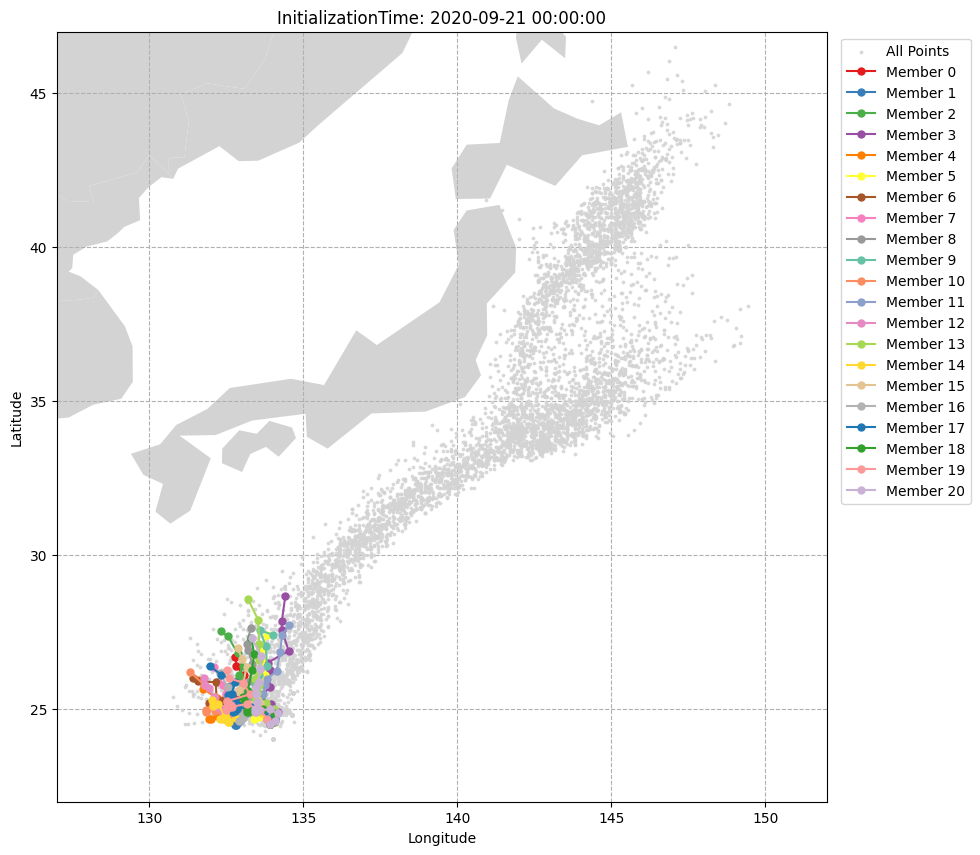

<Figure size 800x800 with 0 Axes>

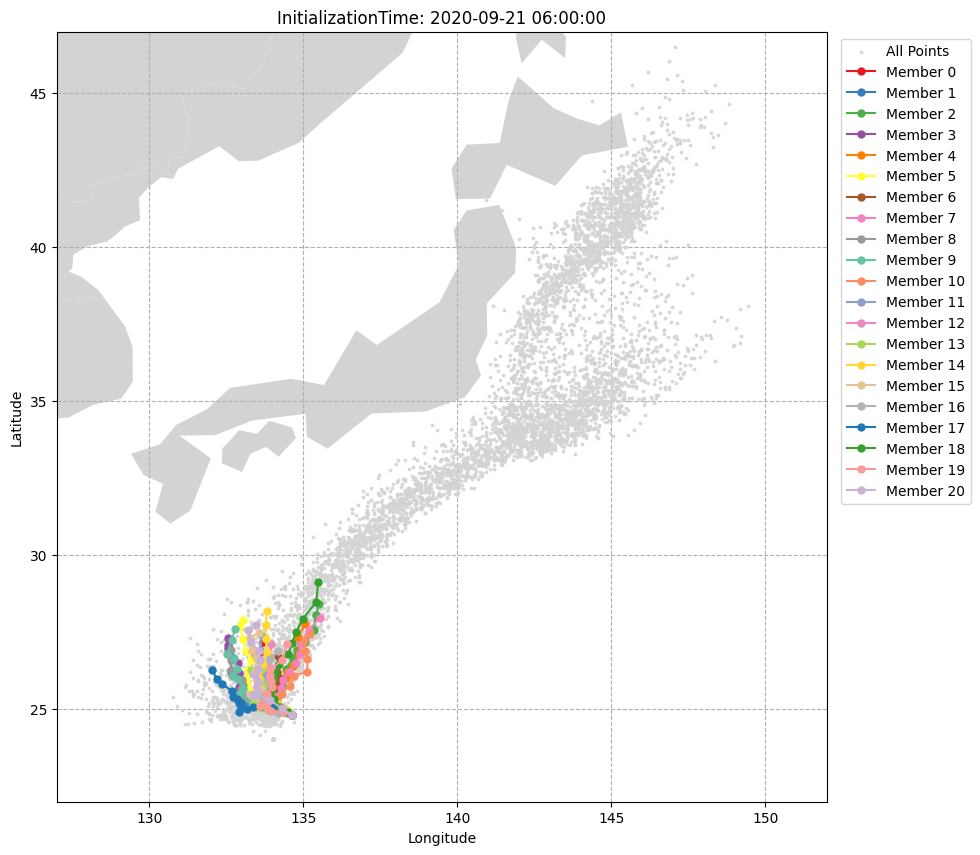

<Figure size 800x800 with 0 Axes>

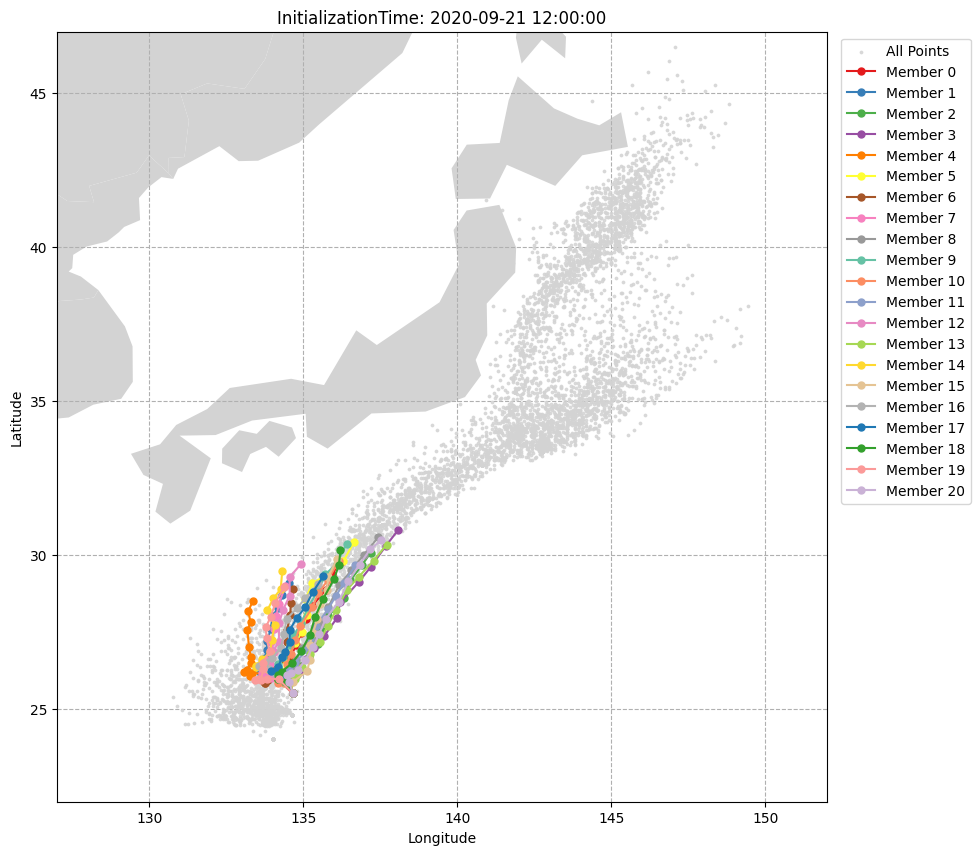

<Figure size 800x800 with 0 Axes>

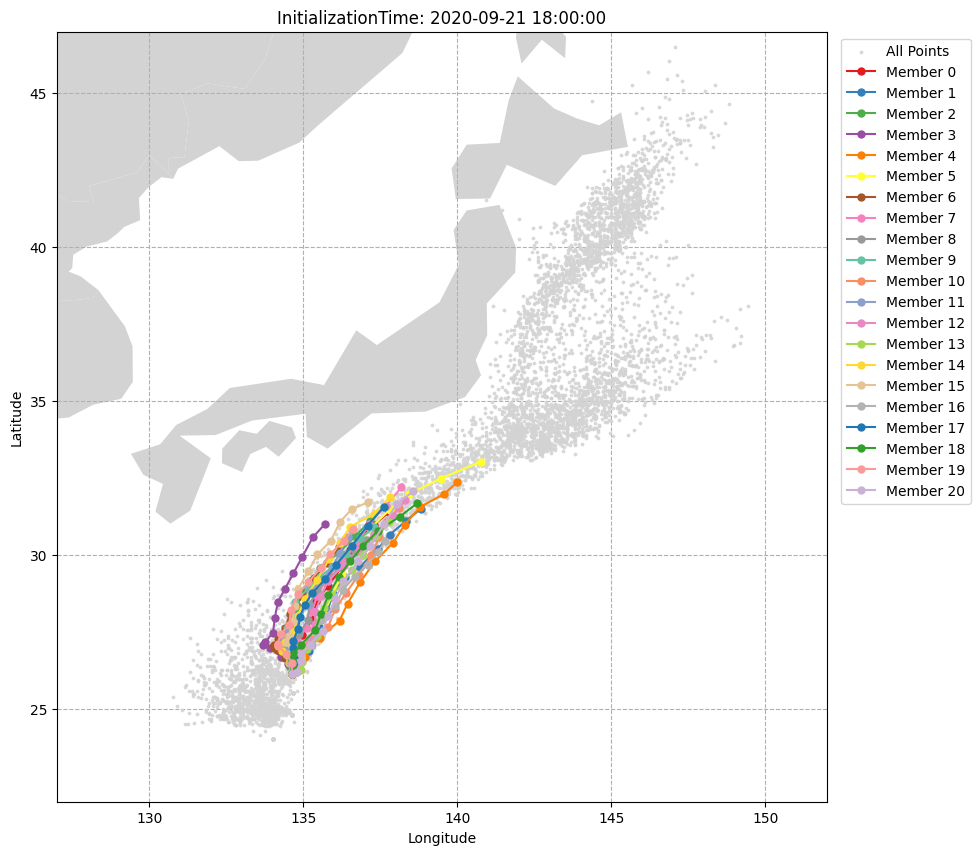

<Figure size 800x800 with 0 Axes>

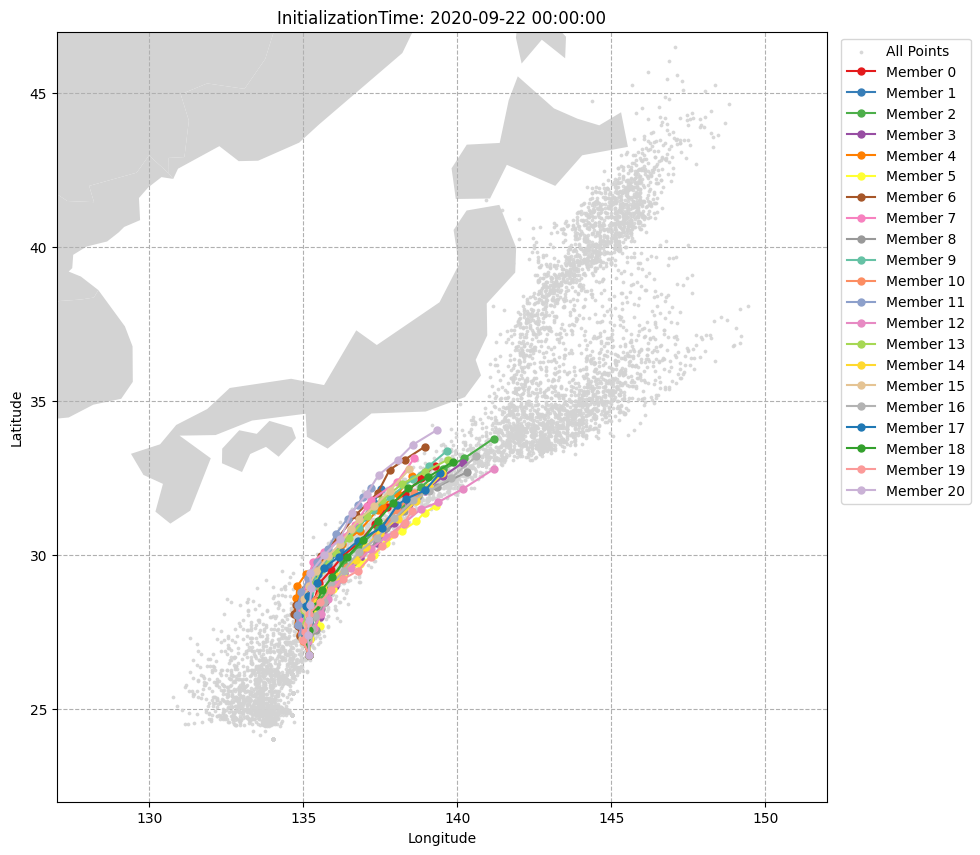

<Figure size 800x800 with 0 Axes>

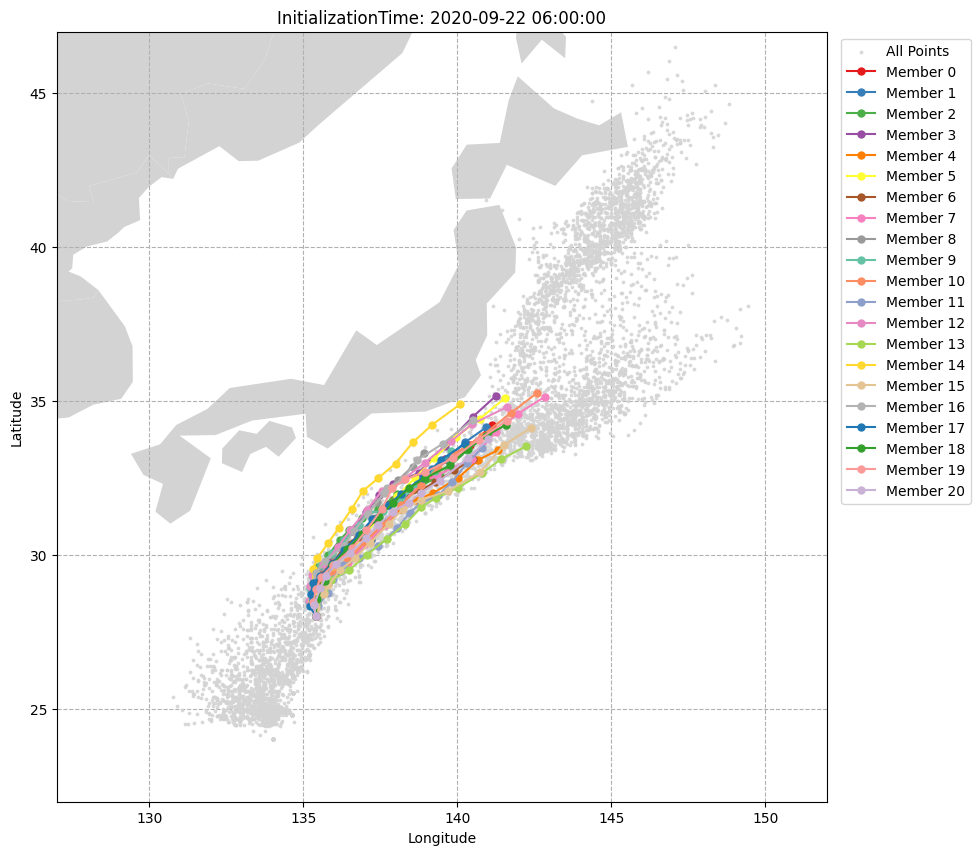

<Figure size 800x800 with 0 Axes>

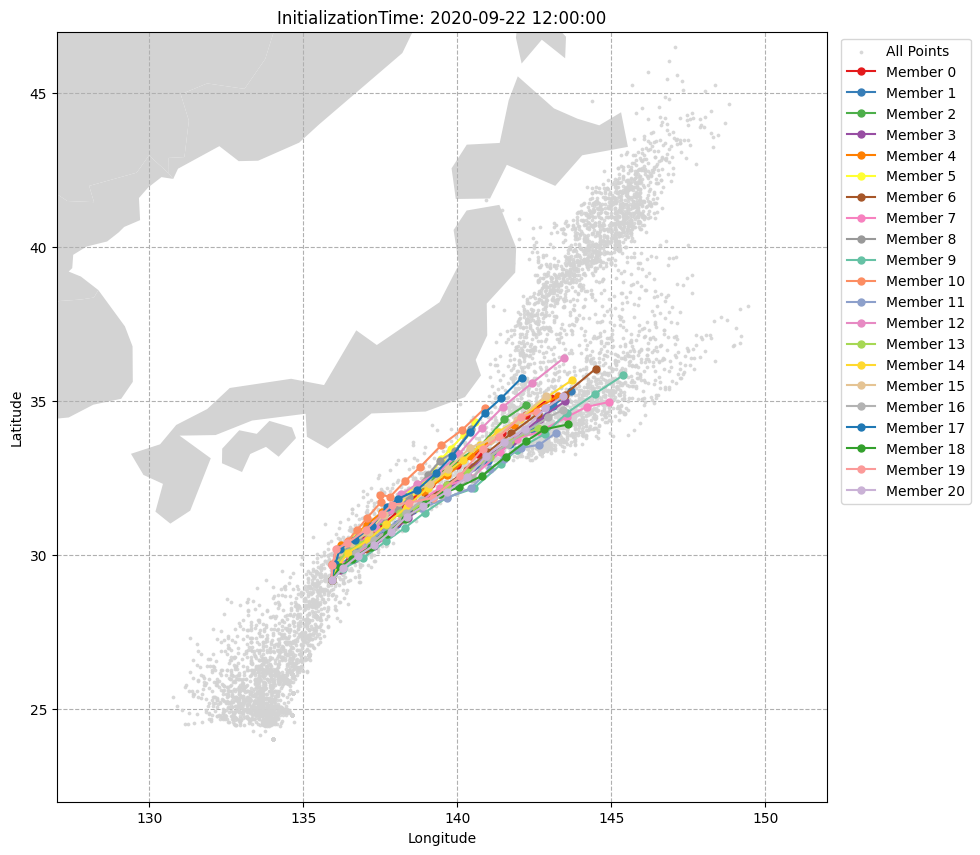

<Figure size 800x800 with 0 Axes>

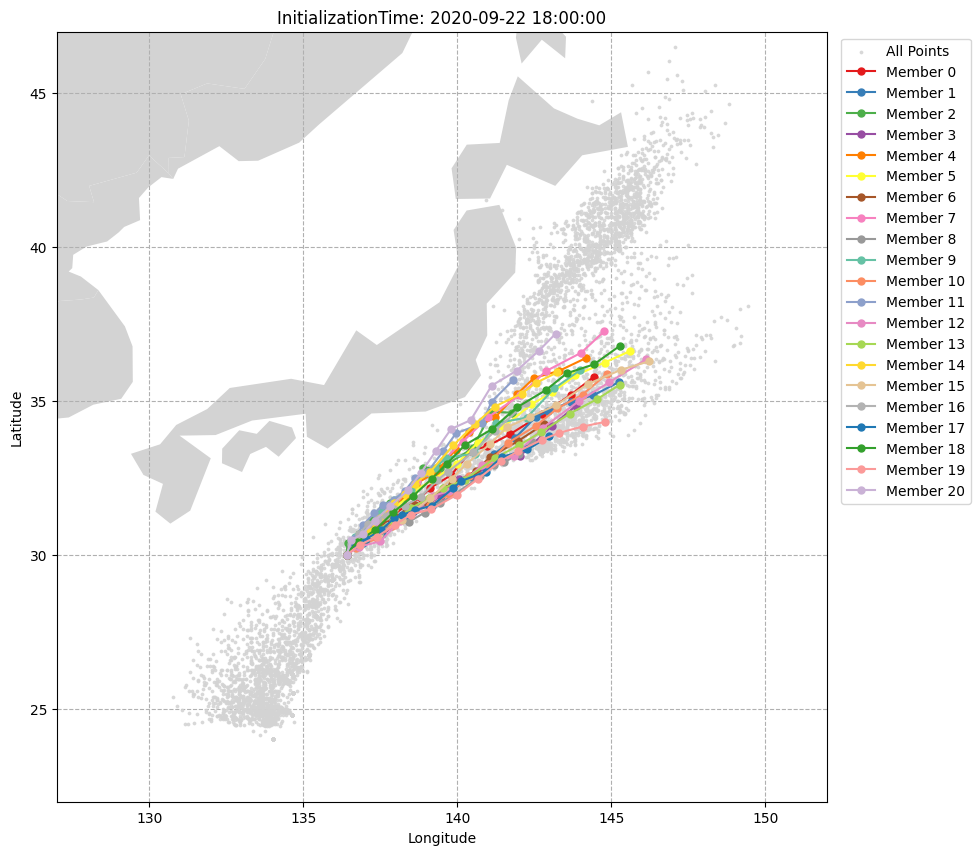

<Figure size 800x800 with 0 Axes>

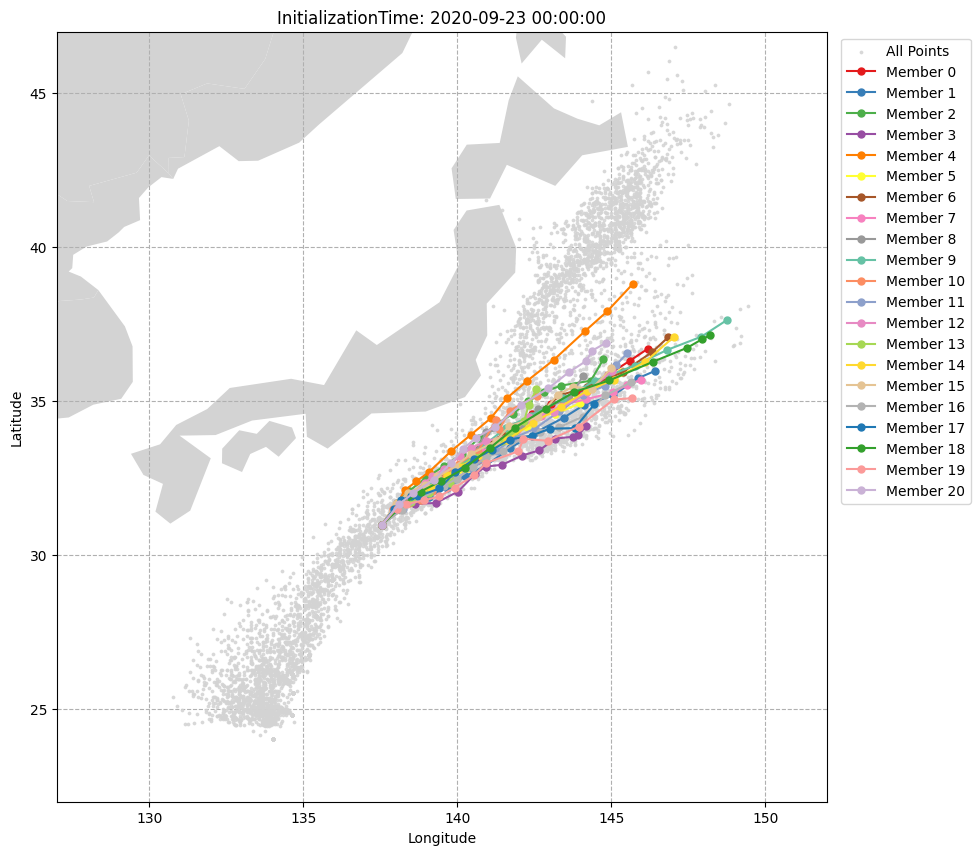

<Figure size 800x800 with 0 Axes>

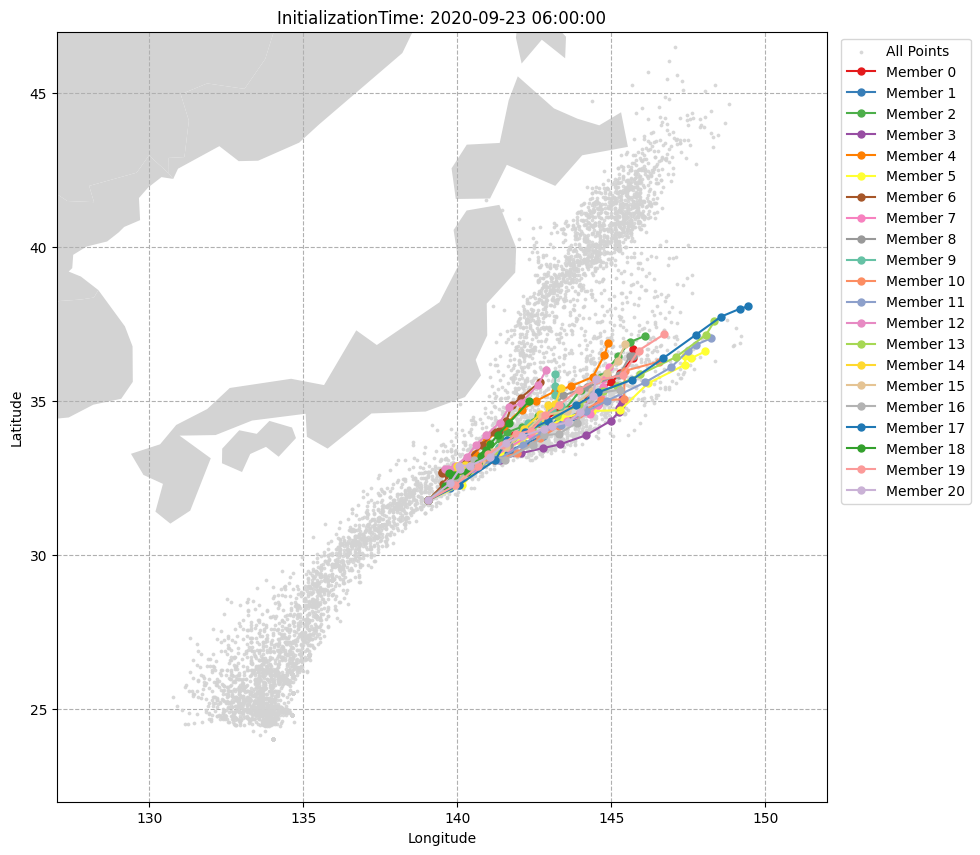

<Figure size 800x800 with 0 Axes>

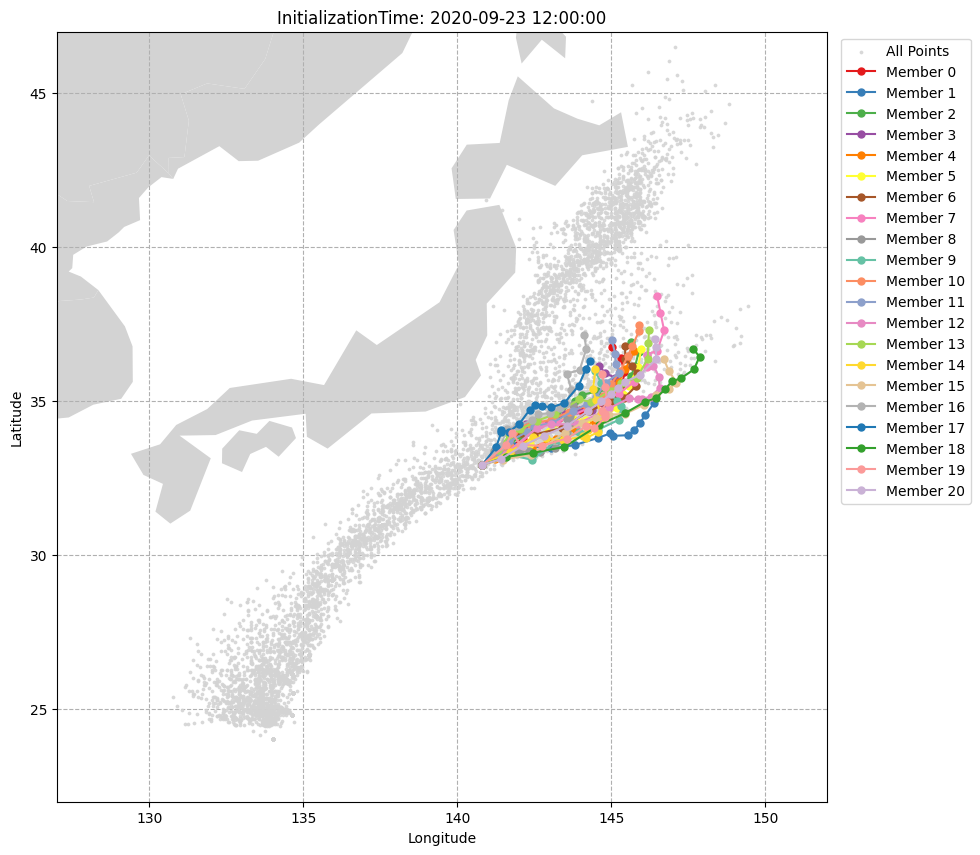

<Figure size 800x800 with 0 Axes>

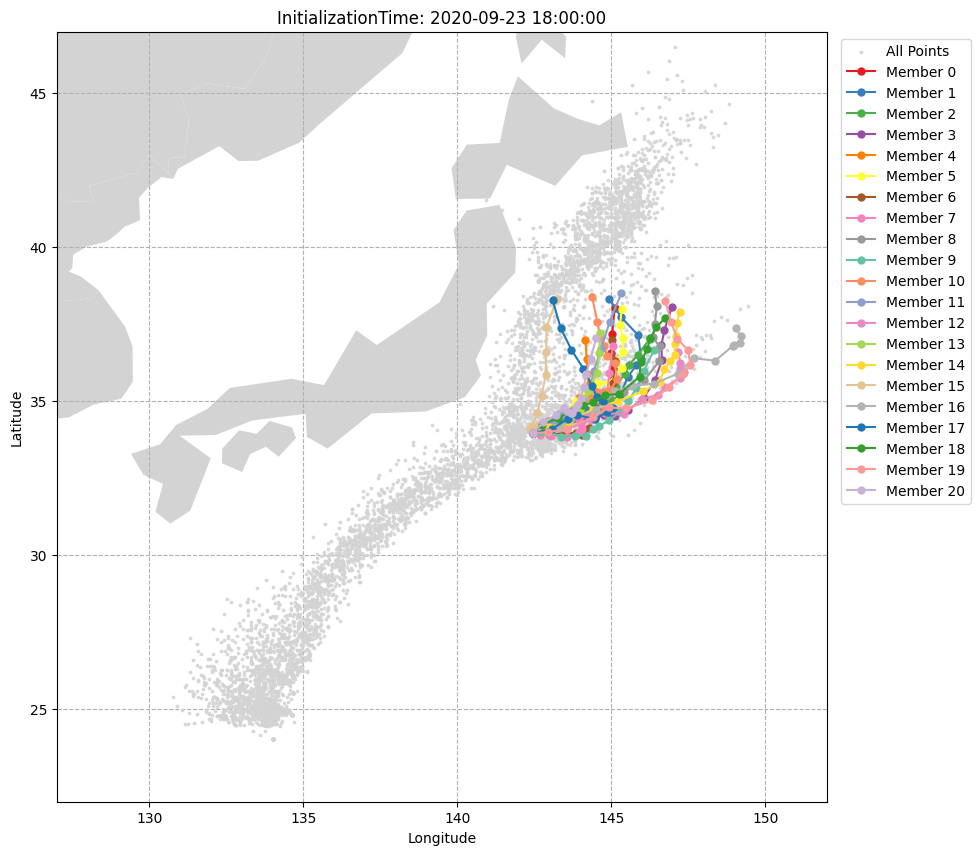

<Figure size 800x800 with 0 Axes>

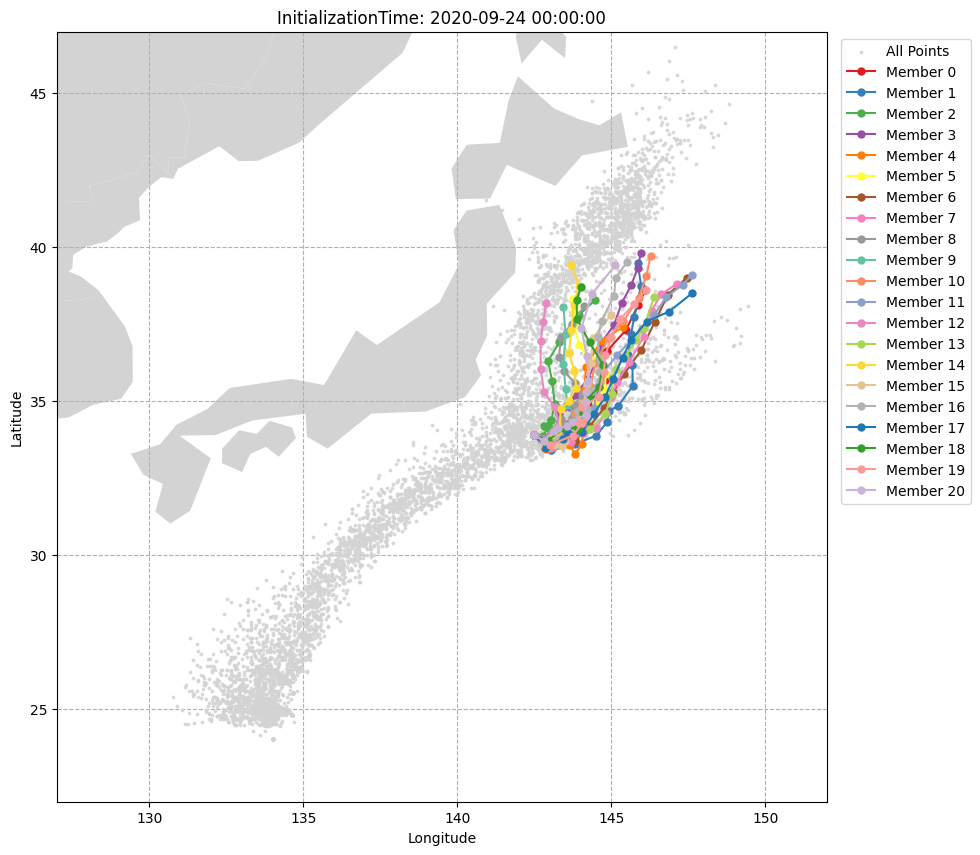

<Figure size 800x800 with 0 Axes>

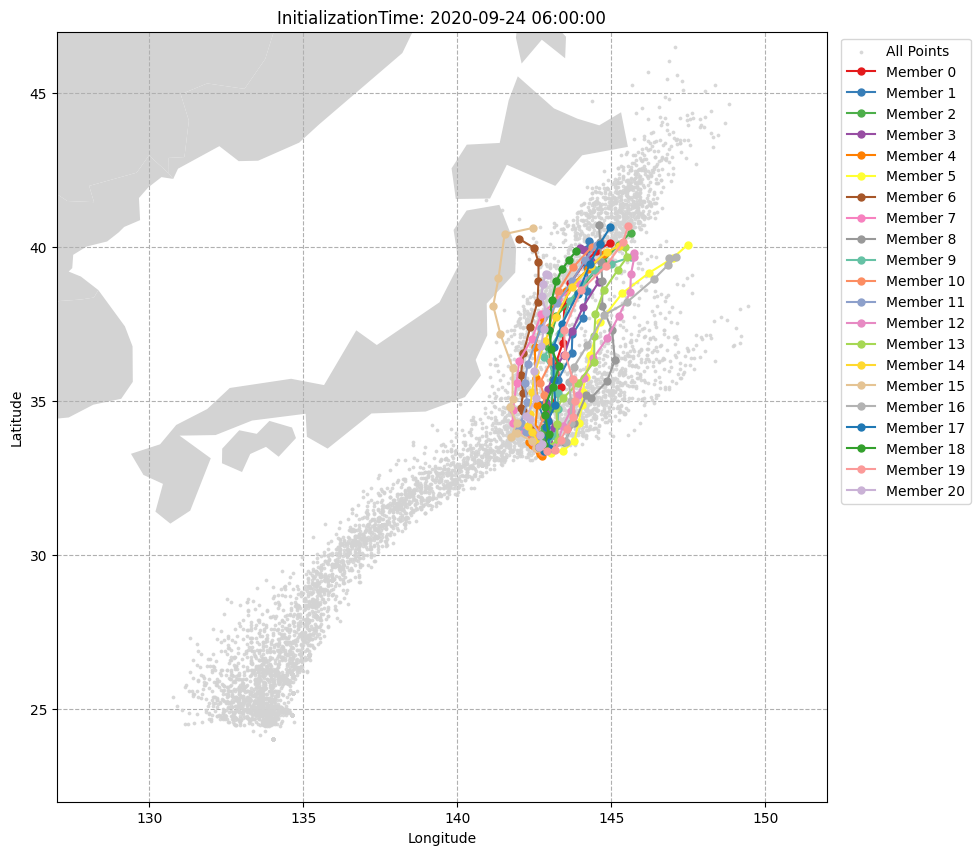

<Figure size 800x800 with 0 Axes>

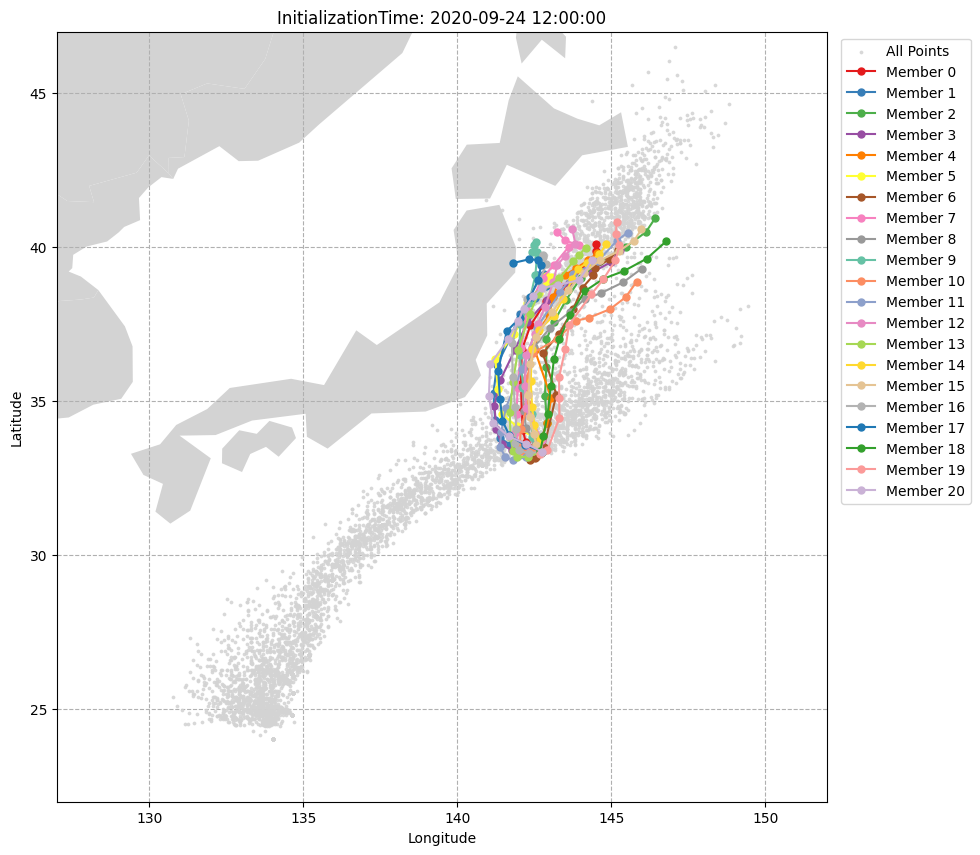

<Figure size 800x800 with 0 Axes>

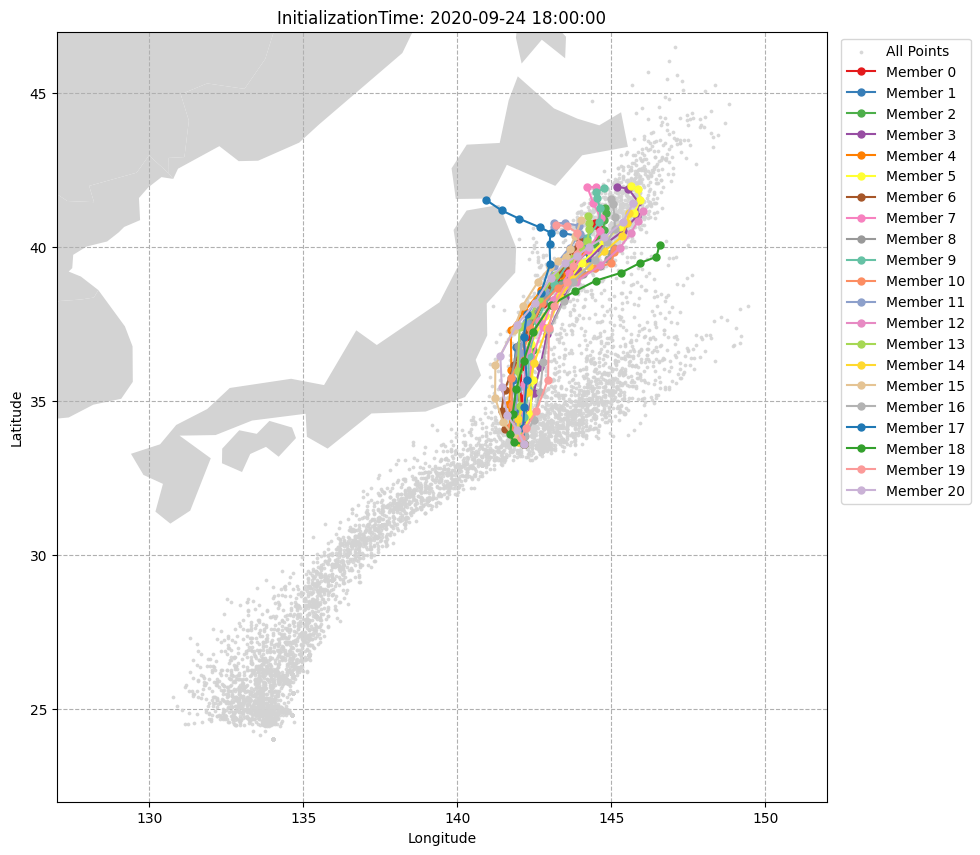

<Figure size 800x800 with 0 Axes>

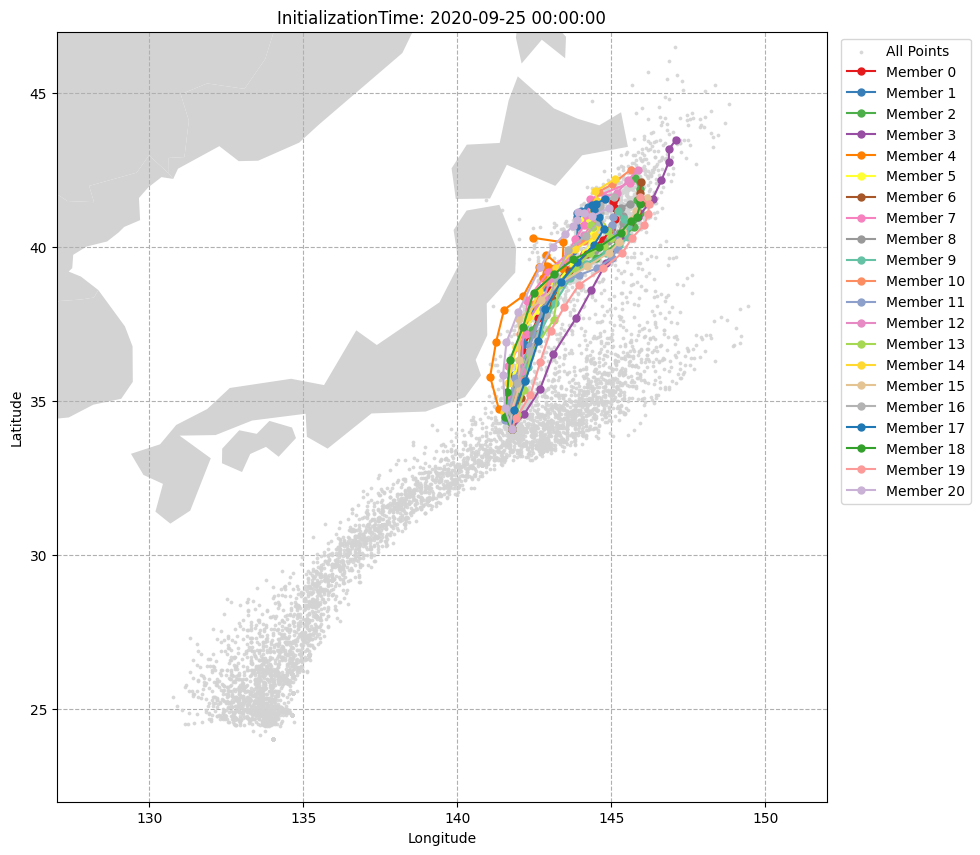

<Figure size 800x800 with 0 Axes>

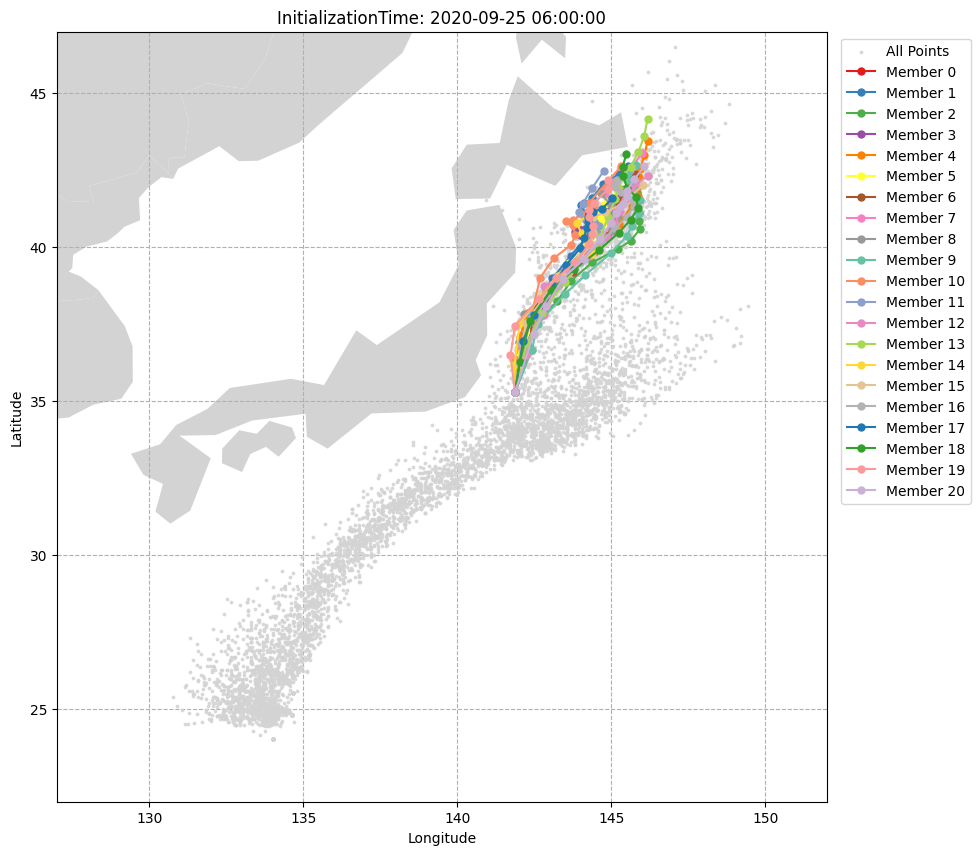

<Figure size 800x800 with 0 Axes>

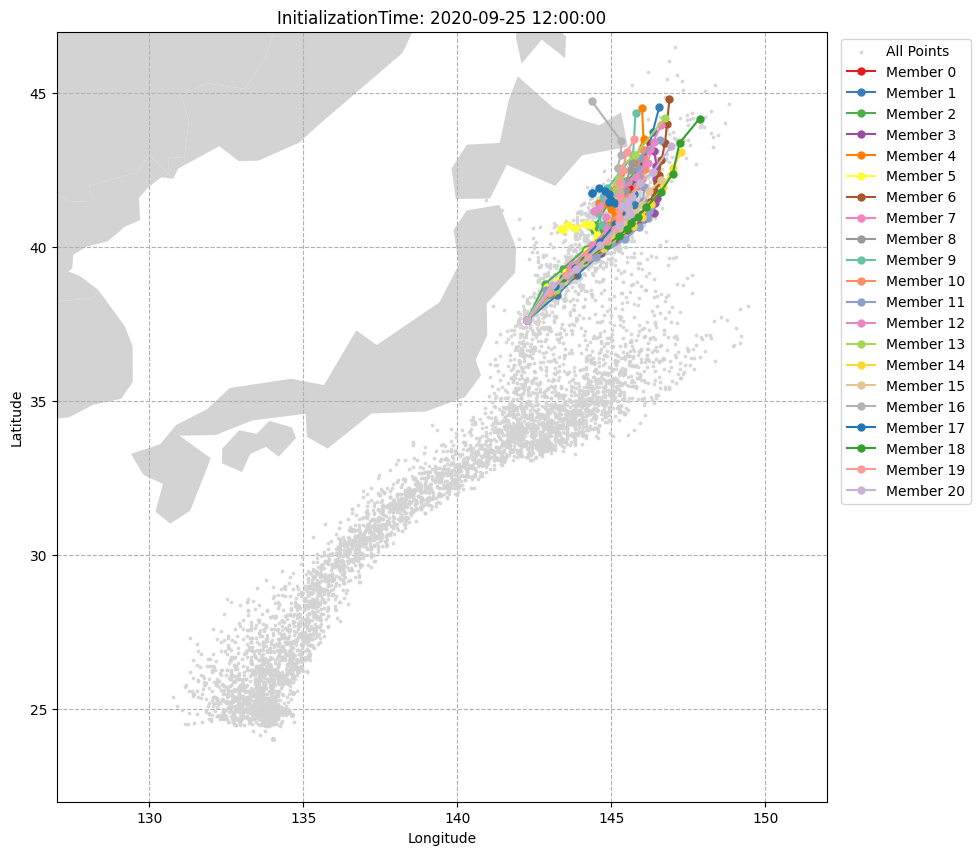

<Figure size 800x800 with 0 Axes>

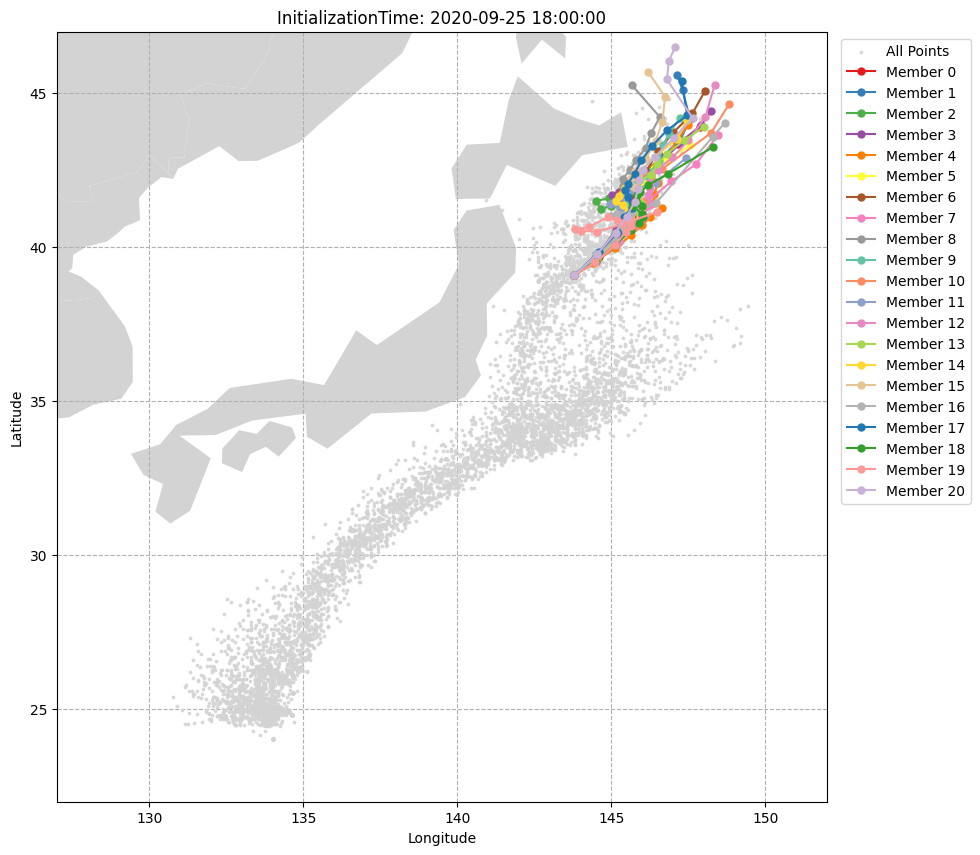

In [19]:
unique_init_times = df_input['InitializationTime'].unique()
world = gpd.read_file("../data/geopandas/ne_110m_admin_0_countries.shp")
long_lim = [127, 152]
lati_lim = [22, 47]

colors = ['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00',
                 '#ffff33', '#a65628', '#f781bf', '#999999', '#66c2a5',
                 '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854', '#ffd92f',
                 '#e5c494', '#b3b3b3', '#1f78b4', '#33a02c', '#fb9a99', '#cab2d6']

for init_time in unique_init_times:
# init_time = unique_init_times[0]
    group = df_input[df_input['InitializationTime'] == init_time]
    plt.figure(figsize=(8, 8))
    # Use default style for a white background
    plt.style.use('default')
    fig, ax = plt.subplots(figsize=(10, 10))
    world.plot(ax=ax, color='lightgray',zorder=0)
    # Plot all points in light gray as background with smaller markers
    plt.scatter(df_input['lon'], df_input['lat'], color='lightgray', s=3, alpha=0.8,label='All Points', zorder=20)
    for i, member in enumerate(group['Member'].unique()):
        member_group = group[group['Member'] == member].sort_index()
        ax.plot(member_group['lon'], member_group['lat'], marker='o', markersize=5, label=f'Member {member}', zorder=30, color=colors[i])
    ax.set_xlim(long_lim)
    ax.set_ylim(lati_lim)
    ax.set_title(f'InitializationTime: {init_time}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.grid(ls="--",zorder=10)
    ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.show()

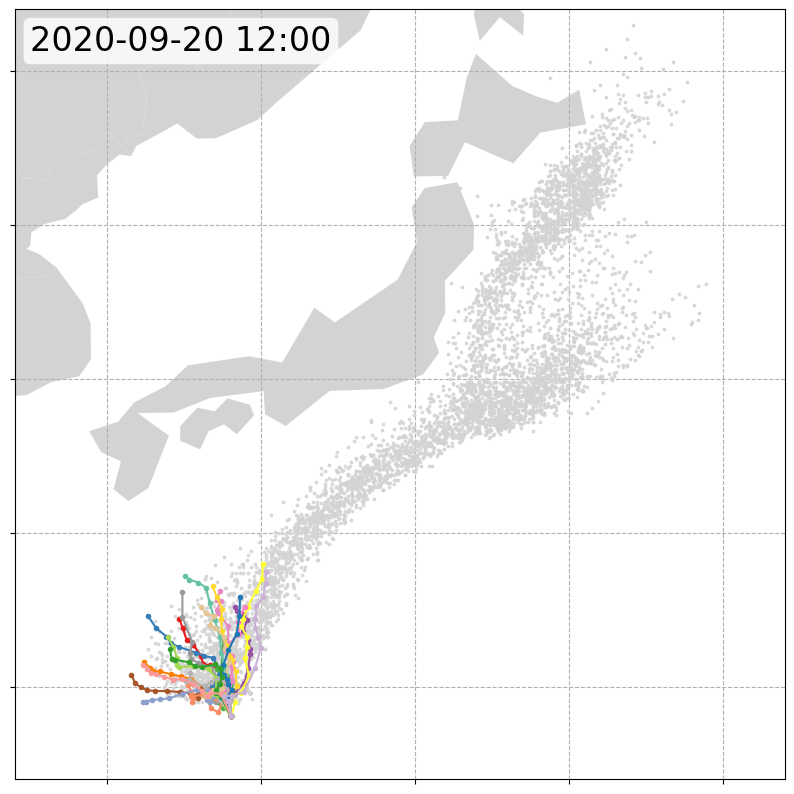

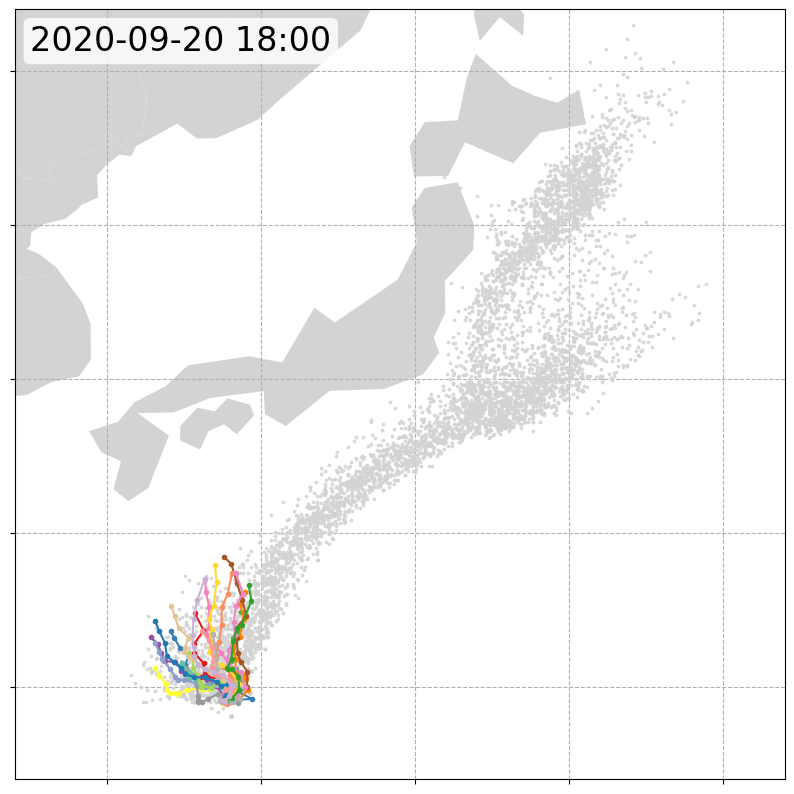

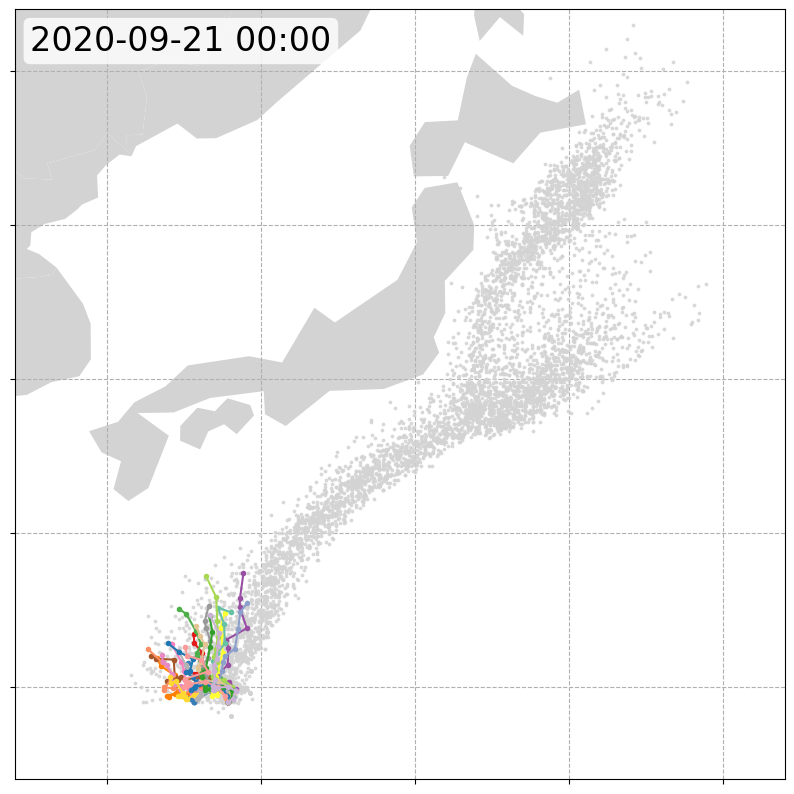

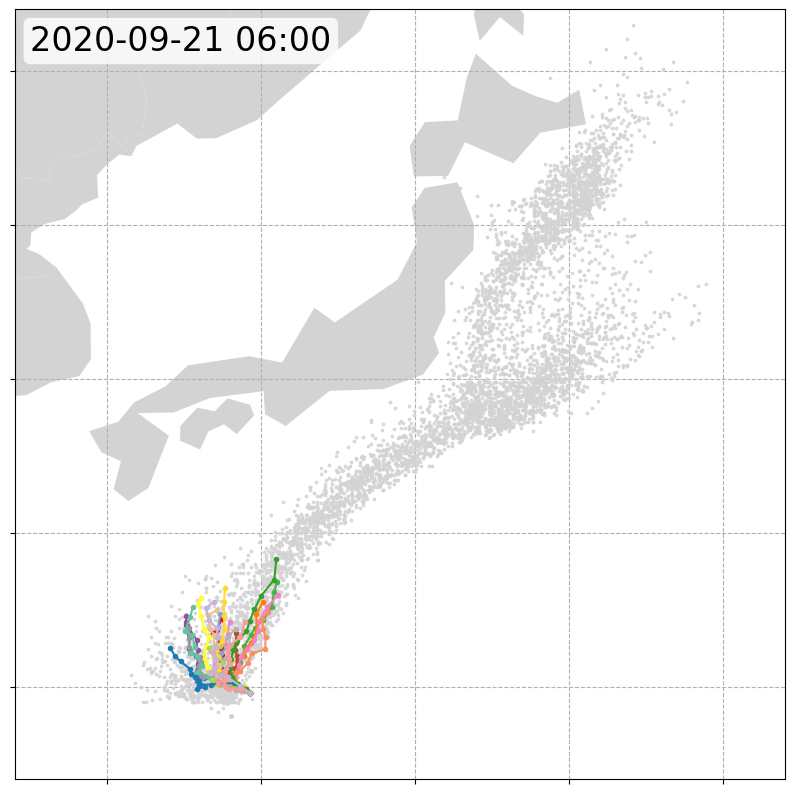

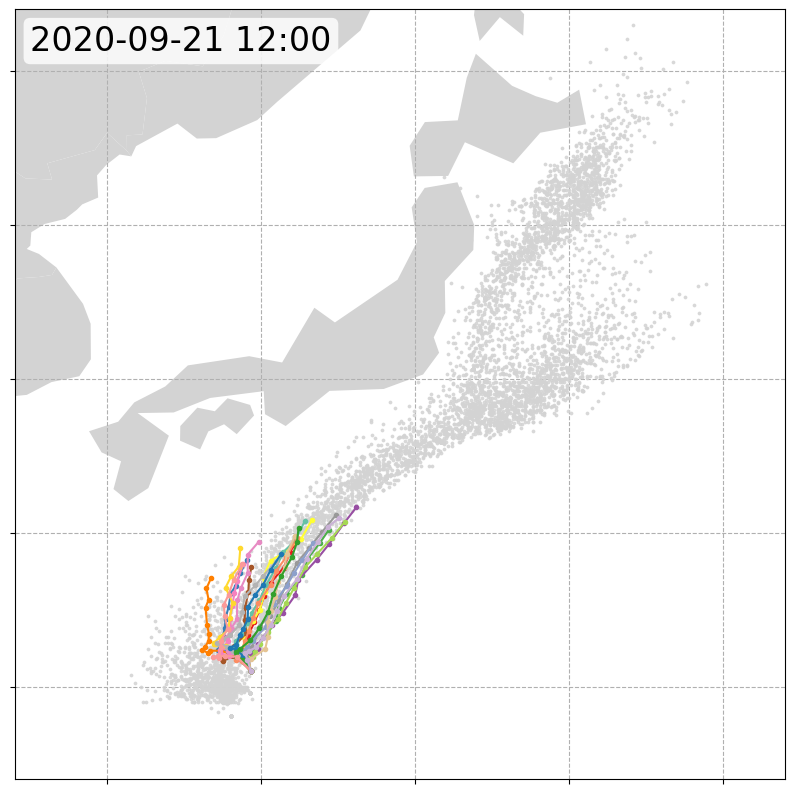

...

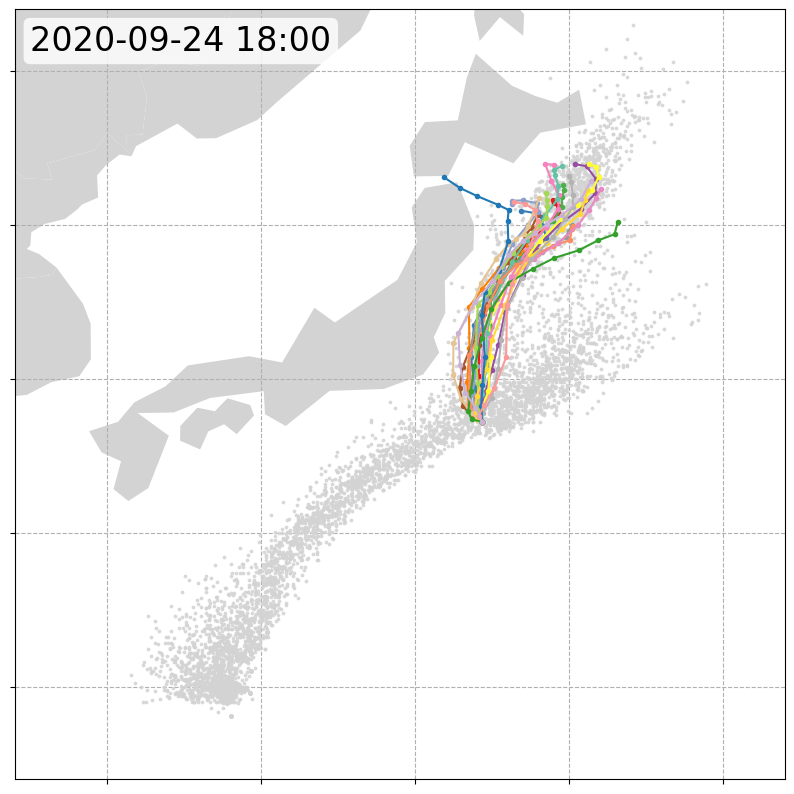

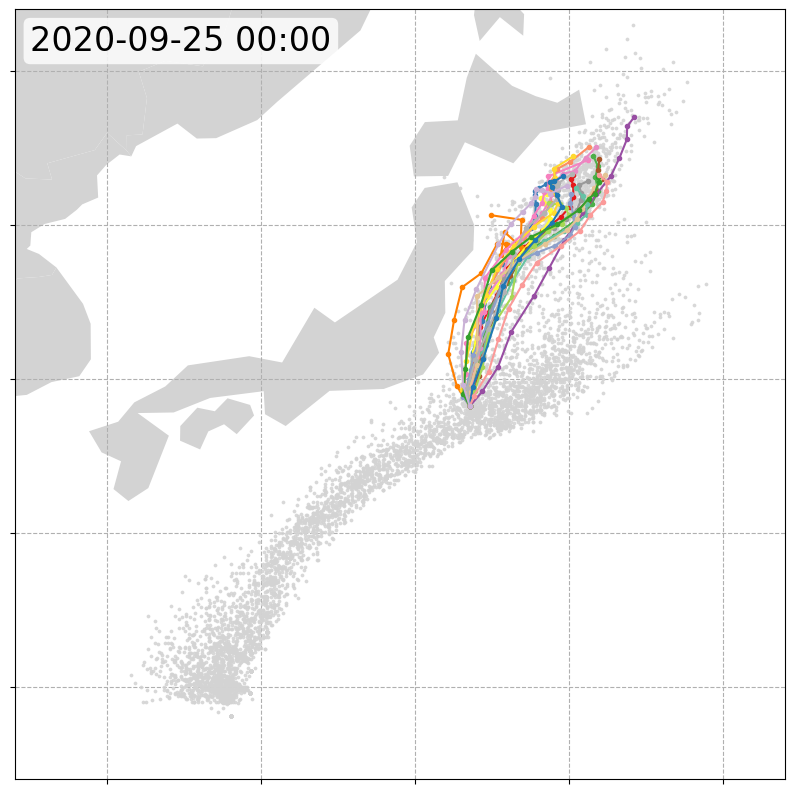

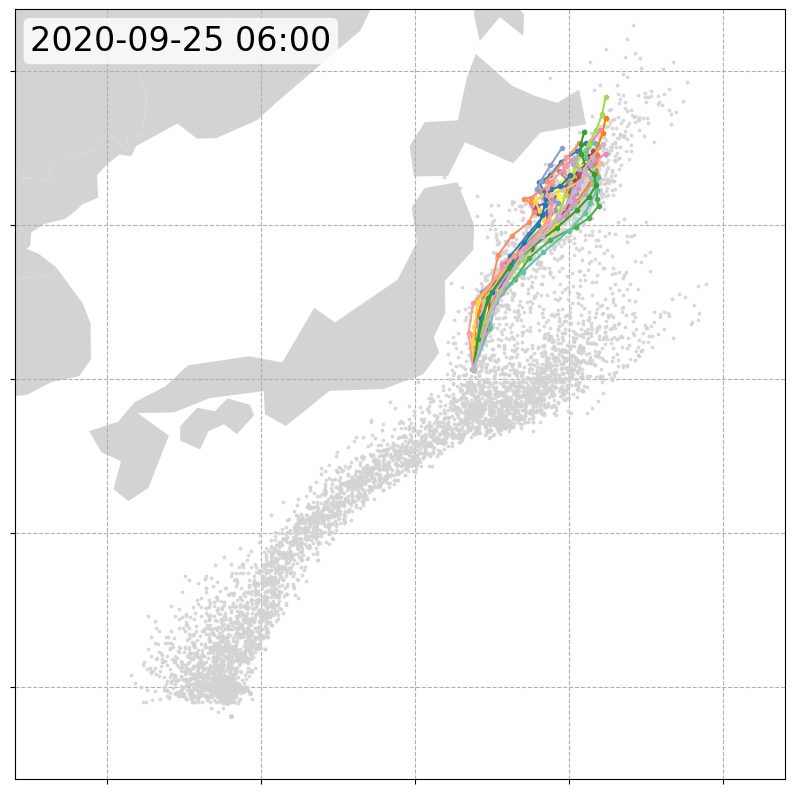

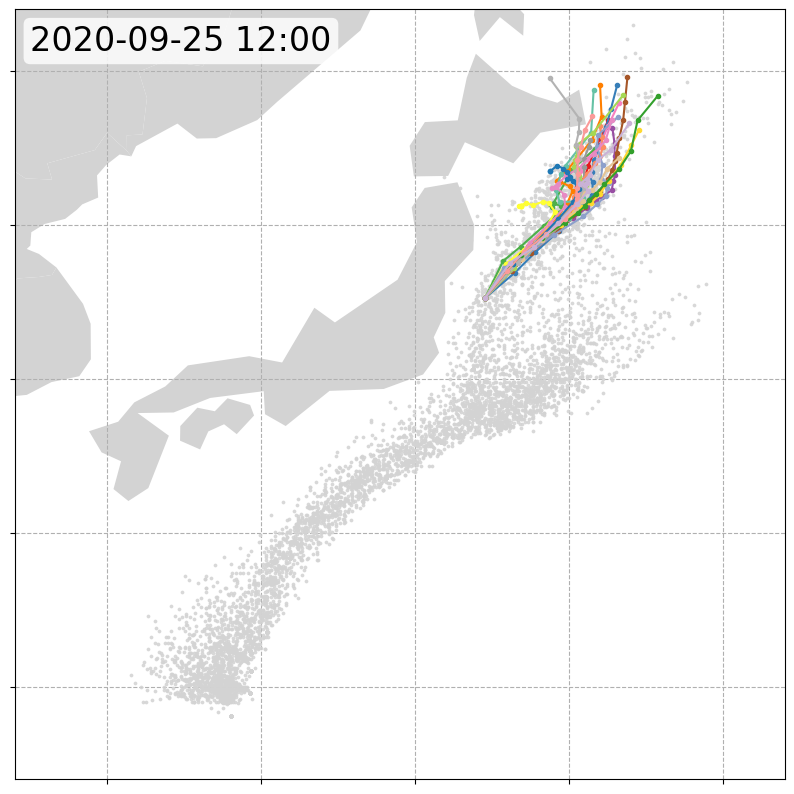

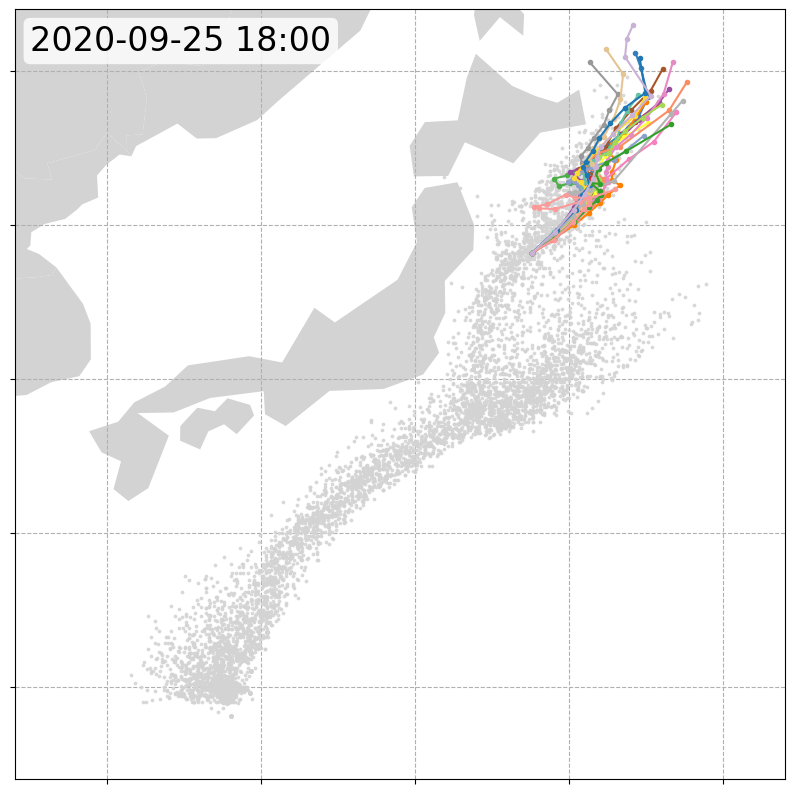

In [35]:
# Plot/save the emsembles

unique_init_times = df_input['InitializationTime'].unique()
world = gpd.read_file("../data/geopandas/ne_110m_admin_0_countries.shp")

colors = ['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00',
                 '#ffff33', '#a65628', '#f781bf', '#999999', '#66c2a5',
                 '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854', '#ffd92f',
                 '#e5c494', '#b3b3b3', '#1f78b4', '#33a02c', '#fb9a99', '#cab2d6']

for init_time in unique_init_times:
# init_time = unique_init_times[0]
    group = df_input[df_input['InitializationTime'] == init_time]
    # plt.figure(figsize=(8, 8))
    # plt.style.use('default')
    fig, ax = plt.subplots(figsize=(10, 10))
    world.plot(ax=ax, color='lightgray',zorder=0)
    # Plot all points in light gray as background with smaller markers
    ax.scatter(df_input['lon'], df_input['lat'], color='lightgray', s=3, alpha=0.8,label='All Points', zorder=20)
    for i, member in enumerate(group['Member'].unique()):
        member_group = group[group['Member'] == member].sort_index()
        ax.plot(member_group['lon'], member_group['lat'], marker='o', markersize=3, label=f'Member {member}', zorder=30, color=colors[i])
    ax.set_xlim(long_lim)
    ax.set_ylim(lati_lim)
    ax.text(
        0.02, 0.98, init_time[:-3],
        ha='left', va='top', fontsize=24,
        transform=ax.transAxes,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.8, boxstyle='round,pad=0.2')
    )
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.tick_params(axis='both', which='major', labelsize=30)
    ax.grid(ls="--",zorder=10)
    init_time_modified = init_time.replace(' ', '_').split(':')[0]
    plt.savefig(f"outputs/Dolphine_emsemble_{init_time_modified}.png", bbox_inches="tight")
    plt.show()


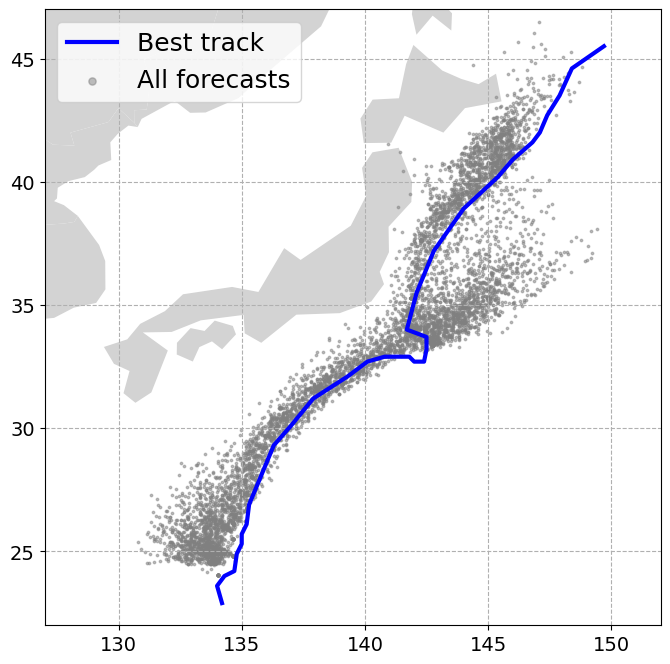

In [36]:
best_track_df = pd.read_csv(f"{DATA_DIR}/Best.Track.2020-12.DOLPHIN.csv", header=0, sep=",")
plt.figure(figsize=(8, 8))
ax = plt.gca()
world.plot(ax=ax, color='lightgray', zorder=0)
ax.plot(best_track_df['lon'], best_track_df['lat'], color='blue', marker='o', markersize=0, label='Best track', zorder=2,lw=3)
ax.scatter(df_input['lon'], df_input['lat'], color='gray', s=3, alpha=0.5, label='All forecasts', zorder=1)
ax.set_xlim(long_lim)
ax.set_ylim(lati_lim)
ax.tick_params(axis='both', which='major', labelsize=14)
plt.legend(fontsize=18, markerscale=3)
plt.grid(ls="--")
plt.savefig(f"outputs/Dolphine_best_track.png", bbox_inches="tight")
plt.show()


# Dfinitions of functions

## Definition of $\varepsilon$-attracting basin

In [22]:
def eps_attracting_basin(df_input, distance_matrix, target_cluster, epsilon_delta=0.01):
    """
    Compute the $\epsilon$-attracting basin for a specified target cluster.

    Parameters:
    df_input (DataFrame): Input DataFrame containing at least 'lon', 'lat', 'cluster', and 'group_id' columns.
    distance_matrix (ndarray): Precomputed matrix of distances between all points.
    target_cluster (int): The cluster index for which the epsilon attracting basin is computed.
    epsilon_delta (float, optional): Increment used in the iterative process to adjust epsilon. Defaults to 0.01.

    Returns:
    ndarray: Array of epsilon values corresponding to each point in the DataFrame.
    """
    # Initialize epsilons with infinity
    epsilons = np.full(df_input.shape[0], np.inf, dtype=float)
    matching_cluster_indices = df_input[df_input['cluster'] == target_cluster].index
    matching_rows = []
    
    for idx in matching_cluster_indices:
        group_id = df_input.loc[idx, 'group_id']
        idx_pos = df_input.index.get_loc(idx)
        group_indices = np.where(df_input['group_id'].values == group_id)[0]
        valid_indices = group_indices[group_indices <= idx_pos]
        matching_rows.extend(df_input.index[valid_indices])
    
    idx_0 = np.unique(matching_rows)
    epsilons[idx_0] = 0

    # Phase 1: Increase epsilon for points with distance below epsilon
    epsilon = 0
    dist_min = np.full(df_input.shape[0], np.inf, dtype=float)
    while all(epsilons < epsilon) == False:
        remain_indices = np.where(epsilons > epsilon)[0]
        asign_indices = np.where(epsilons <= epsilon)[0]
        dist_submatrix = distance_matrix[np.ix_(remain_indices, asign_indices)]
        dist_min[remain_indices] = np.min(dist_submatrix, axis=1)
        for gid in np.unique(df_input['group_id'][remain_indices]):
            group_mask = np.where(df_input['group_id'] == gid)[0]
            group_epsilon = np.array([np.min(dist_min[group_mask][i:]) for i in range(len(group_mask))])
            epsilons[group_mask[(group_epsilon < epsilon) & (epsilons[group_mask] > epsilon)]] = epsilon

        if len(remain_indices) == len(np.where(epsilons > epsilon)[0]):
            epsilon = epsilon + epsilon_delta
    epsilons[idx_0] = 0
    
    # Phase 2: Decrease epsilon for points still at 0 based on their minimum distances
    epsilon = epsilon_delta
    dist_min = np.min(distance_matrix, axis=1)
    while any(epsilons == 0):
        remain_indices = np.where(epsilons == 0)[0]
        asign_indices = np.where(epsilons != 0)[0]
        dist_submatrix = distance_matrix[np.ix_(remain_indices, asign_indices)]
        dist_min[remain_indices] = np.min(dist_submatrix, axis=1)
        for gid in np.unique(df_input['group_id'][remain_indices]):
            group_mask = np.where(df_input['group_id'] == gid)[0]
            group_epsilon = np.array([np.min(dist_min[group_mask][i:]) for i in range(len(group_mask))])
            epsilons[group_mask[(group_epsilon < epsilon) & (epsilons[group_mask] == 0)]] = -epsilon

        if len(remain_indices) == len(np.where(epsilons == 0)[0]):
            epsilon = epsilon + epsilon_delta
    
    epsilons[df_input['cluster'] == target_cluster] = -np.inf
    
    return epsilons

## Definition of $\varepsilon_\Sigma$-attracting basin

In [23]:
def eps_sum_attracting_basin(df_input, distance_matrix, target_cluster, epsilon_delta=0.01):
    """
    Compute the $\epsilon_\Sigma$-attracting basin for a specified target cluster.
    
    Parameters:ters:ters:
      df_input (DataFrame): Input DataFrame containing columns such as 'lon', 'lat', 'cluster', and 'group_id'.'lat', 'cluster', and 'group_id'.'lat', 'cluster', and 'group_id'.
      distance_matrix (ndarray): A precomputed matrix of Euclidean distances between all points. Euclidean distances between all points. Euclidean distances between all points.
      target_cluster (int): The cluster for which the ε attracting basin is to be computed.cting basin is to be computed.cting basin is to be computed.
      epsilon_delta (float, optional): Increment used in the iterative process to adjust epsilon. Defaults to 0.01.

    Returns:rns:rns:
      ndarray: An array of cumulative ε values corresponding to each point in df_input. corresponding to each point in df_input. corresponding to each point in df_input.
    """
    # Initialize epsilons with infinity
    sig_epsilons = np.full(df_input.shape[0], np.inf, dtype=float)
    # Get the indices of the points belonging to the target clustere points belonging to the target clustere points belonging to the target cluster
    matching_cluster_indices = df_input[df_input['cluster'].isin([target_cluster])].index
    # For each target point, collect indices of the points in the same group that come before or at the current pointes of the points in the same group that come before or at the current pointes of the points in the same group that come before or at the current point
    matching_rows = []
    for idx in matching_cluster_indices:
        group_id = df_input.loc[idx, 'group_id']
        idx_pos = df_input.index.get_loc(idx)
        group_indices = np.where(df_input['group_id'].values == group_id)[0]
        valid_indices = group_indices[group_indices <= idx_pos]
        matching_rows.extend(df_input.index[valid_indices])
    idx_0 = np.unique(matching_rows)
    sig_epsilons[idx_0] = 0

    # Phase 1: Calculate ε > 0 by incrementing ε based on the minimum distance for each point based on the minimum distance for each point incrementing ε based on the minimum distance for each point
    epsilon = 0
    dist_min = np.full(df_input.shape[0], np.inf, dtype=float)
    while any(sig_epsilons > epsilon):
        remain_indices = np.where(sig_epsilons > epsilon)[0]
        asign_indices = np.where(sig_epsilons <= epsilon)[0]
        dist_submatrix = distance_matrix[np.ix_(remain_indices, asign_indices)]
        dist_min[remain_indices] = np.min(dist_submatrix, axis=1)
        for gid in np.unique(df_input['group_id'][remain_indices]):
            group_mask = np.where(df_input['group_id'] == gid)[0]
            group_epsilon = np.array([np.min(dist_min[group_mask][i:]) for i in range(len(group_mask))])
            sig_epsilons[group_mask] = np.min(np.vstack((sig_epsilons[group_mask], group_epsilon + epsilon)), axis=0)
        epsilon += epsilon_delta

    # Phase 2: Readjust points with ε value of 0 based on distance informations with ε value of 0 based on distance informations with ε value of 0 based on distance information
    epsilon = 0
    dist_min = np.full(df_input.shape[0], np.inf, dtype=float)
    sig_epsilons_tmp = sig_epsilons.copy()
    sig_epsilons_tmp[idx_0] = -np.inf
    while any(sig_epsilons_tmp <= -epsilon):
        remain_indices = np.where(sig_epsilons_tmp <= -epsilon)[0]
        asign_indices = np.where(sig_epsilons_tmp > -epsilon)[0]
        dist_submatrix = distance_matrix[np.ix_(remain_indices, asign_indices)]
        dist_min[remain_indices] = np.min(dist_submatrix, axis=1)
        for gid in np.unique(df_input['group_id'][remain_indices]):
            group_mask = np.where(df_input['group_id'] == gid)[0]
            group_epsilon = np.array([np.min(dist_min[group_mask][i:]) for i in range(len(group_mask))])
            sig_epsilons_tmp[group_mask] = np.max(np.vstack((sig_epsilons_tmp[group_mask], -group_epsilon - epsilon)), axis=0)
        epsilon += epsilon_delta
    sig_epsilons[idx_0] = sig_epsilons_tmp[idx_0]
    sig_epsilons[df_input['cluster'] == target_cluster] = -np.inf

    return sig_epsilons

## Definition of Sublevel sets visualization

In [108]:
def sublevel_set_visualization(points, colors, linewidth=0.5, color_name="$\\epsilon$", 
                               save_filename=None, vmin=None, vmax=None, xlim=[130,150], ylim=[23,47]):
    """
    Sublevel sets visualization of $\epsilon$- or $\epsilon_\Sigma$-attracting basin.

    Parameters:
        points (ndarray): N×2 array of points for triangulation.
        colors (ndarray): Array of values used for coloring the triangulation.
        linewidth (float): Width of contour lines.
        color_name (str): Label for the colorbar.
        save_filename (str): If provided, the plot will be saved with this filename.
        vmin (float): Minimum value for the colormap normalization.
        vmax (float): Maximum value for the colormap normalization.
        xlim (list): Limits for the xaa-axis.
        ylim (list): Limits for the y-axis.
    """
    # Create Delaunay triangulation of the points
    tri = Delaunay(points)
    simplices = tri.simplices

    # Compute triangle vertices and their areas
    tri_pts = points[simplices]  # shape (n_tri, 3, 2)
    areas = 0.5 * np.abs(np.cross(tri_pts[:,1] - tri_pts[:,0], tri_pts[:,2] - tri_pts[:,0]))
    area_threshold = np.percentile(areas, 99.5)
    mask_area = areas < area_threshold

    # Compute maximum edge lengths for each triangle
    d01 = np.linalg.norm(tri_pts[:, 0] - tri_pts[:, 1], axis=1)
    d12 = np.linalg.norm(tri_pts[:, 1] - tri_pts[:, 2], axis=1)
    d20 = np.linalg.norm(tri_pts[:, 2] - tri_pts[:, 0], axis=1)
    max_edge = np.max(np.stack([d01, d12, d20], axis=1), axis=1)
    edge_threshold = np.percentile(max_edge, 99.5)
    mask_edge = max_edge < edge_threshold

    # Combine masks and filter out triangles with extremely large areas or edges
    final_mask = mask_area & mask_edge
    filtered_simplices = simplices[final_mask]

    triang = Triangulation(points[:, 0], points[:, 1], filtered_simplices)
    
    # Handle infinite colors by replacing with the minimum finite color value
    if np.isinf(colors).any():
        colors[np.isinf(colors)] = np.min(colors[~np.isinf(colors)])

    plt.figure(figsize=(10, 8))
    
    if vmin is None:
        vmin = np.percentile(colors, 5)
    if vmax is None:
        vmax = np.percentile(colors, 95)
    
    norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
    sf = plt.tripcolor(triang, colors, cmap='bwr', norm=norm, alpha=1, lw=0, zorder=10)
    plt.tricontour(points[:, 0], points[:, 1], filtered_simplices, colors,
                   levels=10, colors='k', linewidths=linewidth, zorder=20)
    
    cbar = plt.colorbar(sf)
    cbar.ax.tick_params(labelsize=20)
    
    xticks = np.arange(np.floor(points[:, 0].min()/5) * 5, np.ceil(points[:, 0].max()/5) * 5 + 1, 5).astype(int)
    yticks = np.arange(np.floor(points[:, 1].min()/5) * 5, np.ceil(points[:, 1].max()/5) * 5 + 1, 5).astype(int)
    
    plt.xticks(xticks)
    plt.yticks(yticks)
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.grid(ls="--", zorder=0)
    plt.tick_params(axis='both', which='major', labelsize=20)
    
    if save_filename:
        plt.savefig(save_filename, bbox_inches='tight')
    plt.show()

In [55]:
def plot_attracting_basin(df_input, eps, good_cluster, bad_cluster, eps_threshold=0, 
                          save_filename=None, lon_lim=None, lat_lim=None):
    """
    Plot the $\varepsilon$- or $\varepsilon_\Sigma$-attracting basin for good and bad clusters.
    
    Parameters:
        df_input (DataFrame): Input data containing at least the columns 'lon', 'lat',
            'ForecastTime', 'Member', and 'cluster'.
        eps (dict): Dictionary of epsilon arrays (keys are cluster identifiers).
        good_cluster: Identifier for the good cluster.
        bad_cluster: Identifier for the bad cluster.
        eps_threshold (float, optional): Threshold value used to highlight points.
            Points with epsilon less than or equal to basin_threshold (for the good cluster)
            or less than or equal to -basin_threshold (for the bad cluster) are emphasized.
            Defaults to 0.
        save_filename (str, optional): If provided, the figure is saved with this filename.
        lon_lim (list, optional): Limits for the longitude (x) axis.
        lat_lim (list, optional): Limits for the latitude (y) axis.
    """
    PS = 20  # marker size for highlighted points
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Plot background map using the global 'world' GeoDataFrame
    world.plot(ax=ax, color='lightgray', zorder=0)
    ax.set_facecolor('white')

    # Use a normalization for the scatter plot color scale
    ax.scatter(df_input['lon'], df_input['lat'], color="lightgray", s=10,
               alpha=0.8, zorder=10)
    
    # Highlight 'good' cluster points where epsilon is below the threshold
    good_mask = eps[good_cluster] <= eps_threshold
    ax.scatter(df_input.loc[good_mask, 'lon'], df_input.loc[good_mask, 'lat'], 
               color="red", s=PS, linewidths=1.5, zorder=20)
    
    # Highlight 'bad' cluster points where epsilon is below the negative threshold
    bad_mask = eps[bad_cluster] <= -eps_threshold
    ax.scatter(df_input.loc[bad_mask, 'lon'], df_input.loc[bad_mask, 'lat'], 
               color="blue", s=PS, linewidths=1.5, zorder=20)
    
    # Draw dashed lines between forecast points for each ensemble member
    members = sorted(df_input['Member'].unique())
    for member in members:
        member_group = df_input[df_input['Member'] == member].sort_values('ForecastTime')
        ax.plot(member_group['lon'], member_group['lat'], marker='o', markersize=5,
                color="lightgray", ls="--", lw=1, zorder=15)
    
    # Add circles to mark the last forecast point for each cluster based on 'cluster' values
    good_last = df_input[df_input['cluster'] == "Good"].groupby('Member').tail(1)
    for _, row in good_last.iterrows():
        circ = plt.Circle((row['lon'], row['lat']), 0.2, color='red', fill=False, 
                          linewidth=2.5, zorder=20)
        ax.add_patch(circ)
    
    bad_last = df_input[df_input['cluster'] == "Bad"].groupby('Member').tail(1)
    for _, row in bad_last.iterrows():
        circ = plt.Circle((row['lon'], row['lat']), 0.2, color='blue', fill=False, 
                          linewidth=2.5, zorder=20)
        ax.add_patch(circ)
    
    # Set axis limits and ticks if not provided
    if lon_lim is None:
        lon_lim = ax.get_xlim()
    if lat_lim is None:
        lat_lim = ax.get_ylim()
    xticks = np.arange(np.floor(lon_lim[0] / 2) * 2, np.ceil(lon_lim[1] / 2) * 2 + 1, 2).astype(int)
    yticks = np.arange(np.floor(lat_lim[0] / 2) * 2, np.ceil(lat_lim[1] / 2) * 2 + 1, 2).astype(int)
    ax.set_xticks(xticks)
    ax.set_yticks(yticks)
    ax.set_xlim(lon_lim)
    ax.set_ylim(lat_lim)
    ax.grid(ls="--", zorder=0)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    
    if save_filename:
        plt.savefig(save_filename, bbox_inches='tight', dpi=300)
    
    plt.show()

# Numerical experiments with one selected ensamble weather forecasted data

## Select data

In [37]:
time_selected = '2020-09-24 00:00:00'
df_selected = df_input[df_input['InitializationTime'] == time_selected]
df_selected = df_selected.reset_index(drop=True)

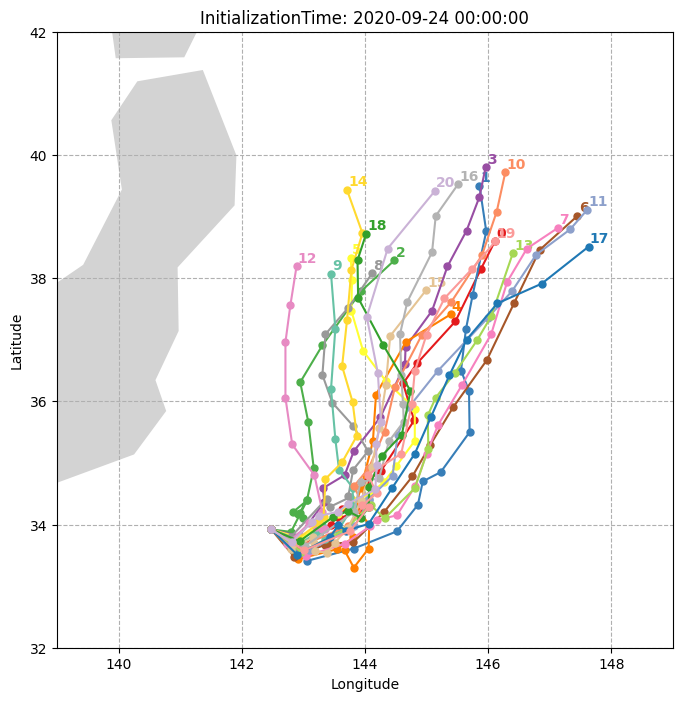

In [38]:

members = sorted(df_selected['Member'].unique())
plt.figure(figsize=(8, 8))
ax = plt.gca()
world.plot(ax=ax, color='lightgray', zorder=0)
colors = ['#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00',
            '#ffff33', '#a65628', '#f781bf', '#999999', '#66c2a5',
            '#fc8d62', '#8da0cb', '#e78ac3', '#a6d854', '#ffd92f',
            '#e5c494', '#b3b3b3', '#1f78b4', '#33a02c', '#fb9a99', '#cab2d6']

for i, member in enumerate(members):
    member_group = df_selected[df_selected['Member'] == member].sort_values('ForecastTime')
    ax.plot(member_group['lon'], member_group['lat'], marker='o', markersize=5, color=colors[i],
            label=f'Member {member}', zorder=20)
for i, member in enumerate(members):
    member_group = df_selected[df_selected['Member'] == member].sort_values('ForecastTime')
    if not member_group.empty:
        last_row = member_group.iloc[-1]
        ax = plt.gca()
        ax.text(
            last_row['lon']+0.02, last_row['lat']+0.02, str(member),
            fontsize=10, color=colors[i], va='bottom', ha='left', weight='bold'
        )
ax.set_xlim([139, 149])
ax.set_ylim([32, 42])
ax.set_title(f'InitializationTime: {time_selected}')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.grid(ls="--", zorder=10)
plt.show()

## Select good cluster

In [39]:
good_members = [6, 7, 11, 17]

last_indices = df_selected.groupby('Member')['ForecastTime'].idxmax()
good_mask = df_selected.index.isin(last_indices[df_selected.loc[last_indices, 'Member'].isin(good_members).values])
bad_mask = df_selected.index.isin(last_indices[~df_selected.loc[last_indices, 'Member'].isin(good_members).values])
df_selected["cluster"] = "Others"
df_selected.loc[good_mask, "cluster"] = "Good"
df_selected.loc[bad_mask, "cluster"] = "Bad"

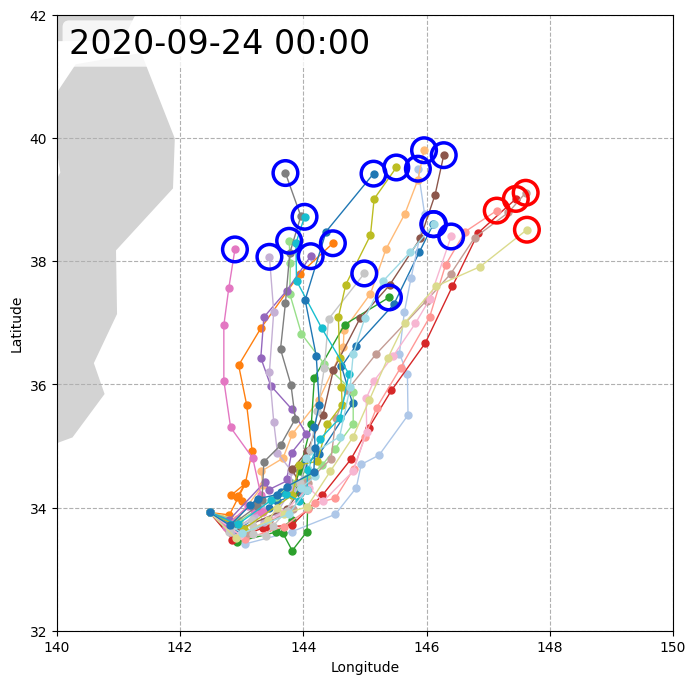

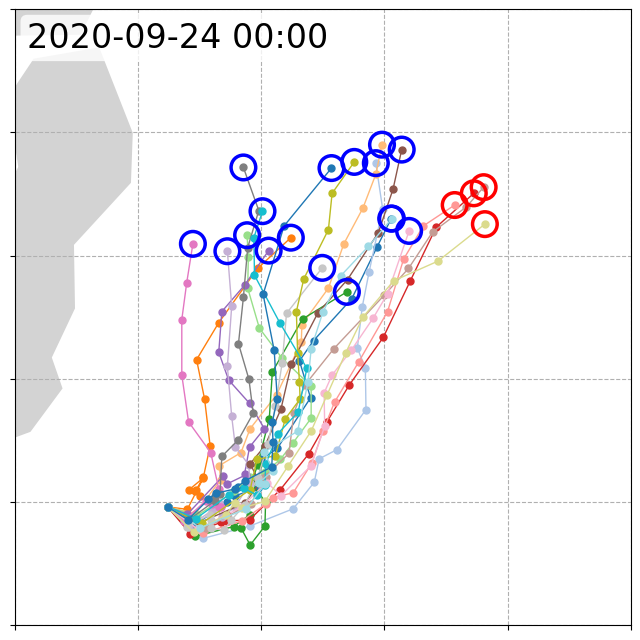

In [40]:
# First plot: display the ensemble forecast with Good/Bad markers
plt.figure(figsize=(8, 8))
ax = plt.gca()
world.plot(ax=ax, color='lightgray', zorder=0)

members = sorted(df_selected['Member'].unique())
cmap = plt.get_cmap('tab20')
member_colors = {m: cmap(i % cmap.N) for i, m in enumerate(members)}

for member in members:
    member_group = df_selected[df_selected['Member'] == member].sort_values('ForecastTime')
    ax.plot(member_group['lon'], member_group['lat'], marker='o', markersize=5,
            color=member_colors[member], label=f'Member {member}', zorder=5, lw=1)

# Mark the last point of each member according to the cluster
good_last = df_selected[df_selected['cluster'] == "Good"].groupby('Member').tail(1)
for _, row in good_last.iterrows():
    circle = plt.Circle((row['lon'], row['lat']), 0.2, color='red', fill=False, linewidth=2.5, zorder=20)
    ax.add_patch(circle)

bad_last = df_selected[df_selected['cluster'] == "Bad"].groupby('Member').tail(1)
for _, row in bad_last.iterrows():
    circle = plt.Circle((row['lon'], row['lat']), 0.2, color='blue', fill=False, linewidth=2.5, zorder=20)
    ax.add_patch(circle)

ax.text(0.02, 0.98, time_selected[:-3],
        ha='left', va='top', fontsize=24,
        transform=ax.transAxes,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.8, boxstyle='round,pad=0.2'))
ax.set_xlim([140, 150])
ax.set_ylim([32, 42])
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.grid(ls="--", zorder=5)
plt.show()

# Second plot: create a figure for saving without tick labels
plt.figure(figsize=(8, 8))
ax = plt.gca()
world.plot(ax=ax, color='lightgray', zorder=0)

members = sorted(df_selected['Member'].unique())
cmap = plt.get_cmap('tab20')
member_colors = {m: cmap(i % cmap.N) for i, m in enumerate(members)}

for member in members:
    member_group = df_selected[df_selected['Member'] == member].sort_values('ForecastTime')
    ax.plot(member_group['lon'], member_group['lat'], marker='o', markersize=5,
            color=member_colors[member], label=f'Member {member}', zorder=5, lw=1)

good_last = df_selected[df_selected['cluster'] == "Good"].groupby('Member').tail(1)
for _, row in good_last.iterrows():
    circle = plt.Circle((row['lon'], row['lat']), 0.2, color='red', fill=False, linewidth=2.5, zorder=20)
    ax.add_patch(circle)

bad_last = df_selected[df_selected['cluster'] == "Bad"].groupby('Member').tail(1)
for _, row in bad_last.iterrows():
    circle = plt.Circle((row['lon'], row['lat']), 0.2, color='blue', fill=False, linewidth=2.5, zorder=20)
    ax.add_patch(circle)

ax.text(0.02, 0.98, time_selected[:-3],
        ha='left', va='top', fontsize=24,
        transform=ax.transAxes,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.8, boxstyle='round,pad=0.2'))
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xlim([140, 150])
ax.set_ylim([32, 42])
ax.grid(ls="--", zorder=5)

init_time_modified = time_selected.replace(' ', '_').split(':')[0]
plt.savefig(f"outputs/Dolphine_emsemble_selected_{init_time_modified}.png", bbox_inches="tight")
plt.show()

## Compute $\varepsilon$-attracting basin

In [ ]:
eps_selected = {}
distance_matrix_selected = pairwise_distances(df_selected[['lon', 'lat']])
eps_selected["Good"] = eps_attracting_basin(df_selected, distance_matrix_selected, target_cluster = "Good")
eps_selected["Bad"] = eps_attracting_basin(df_selected, distance_matrix_selected, target_cluster = "Bad")

## Plot $\varepsilon$-attracting basins for good and bad clusters.

eps_threshold = 0.0


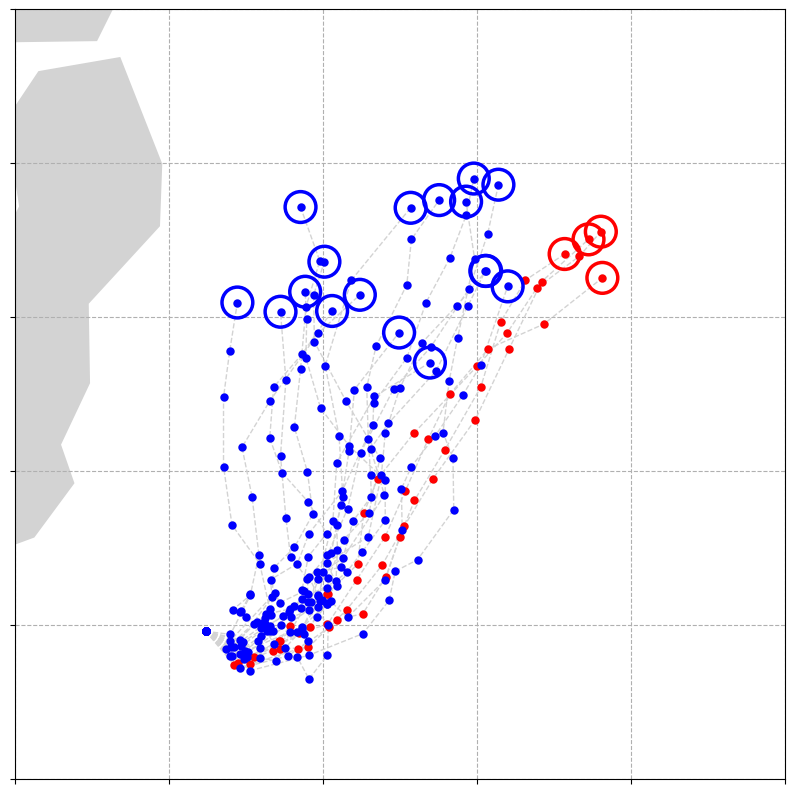

eps_threshold = 0.1


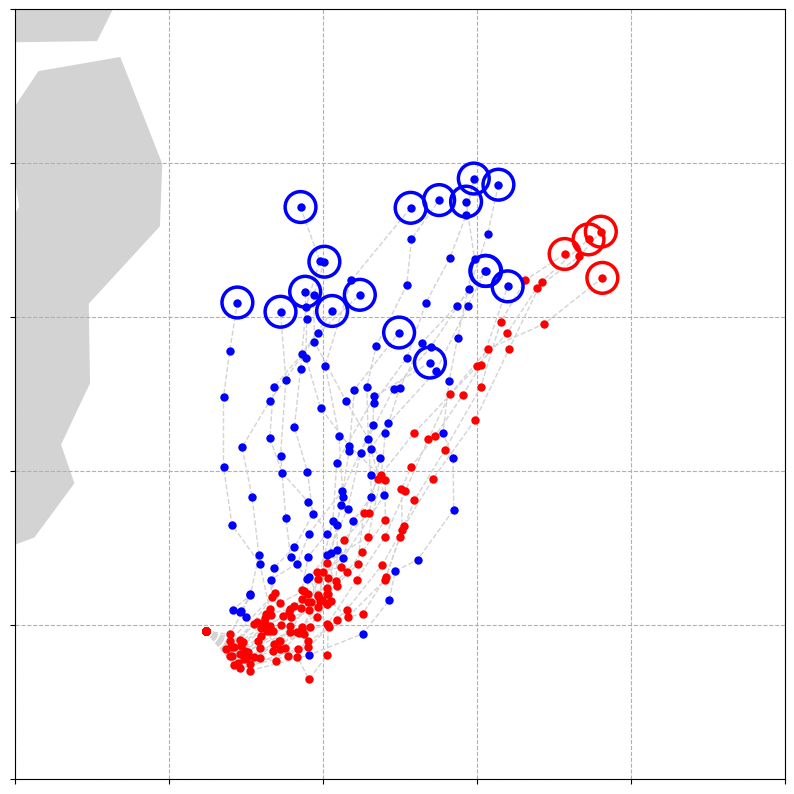

eps_threshold = 0.2


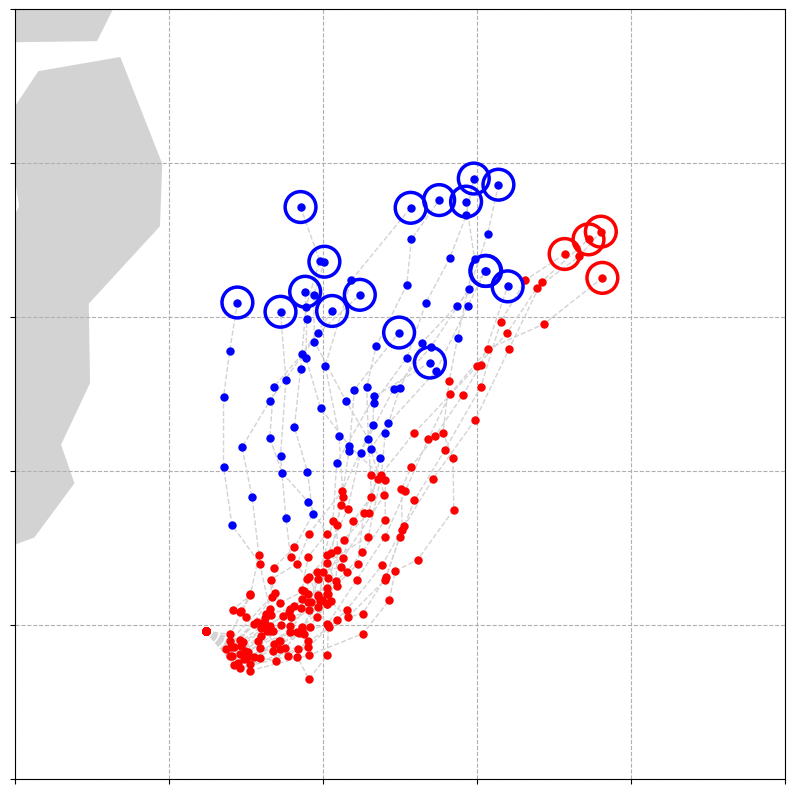

eps_threshold = 0.30000000000000004


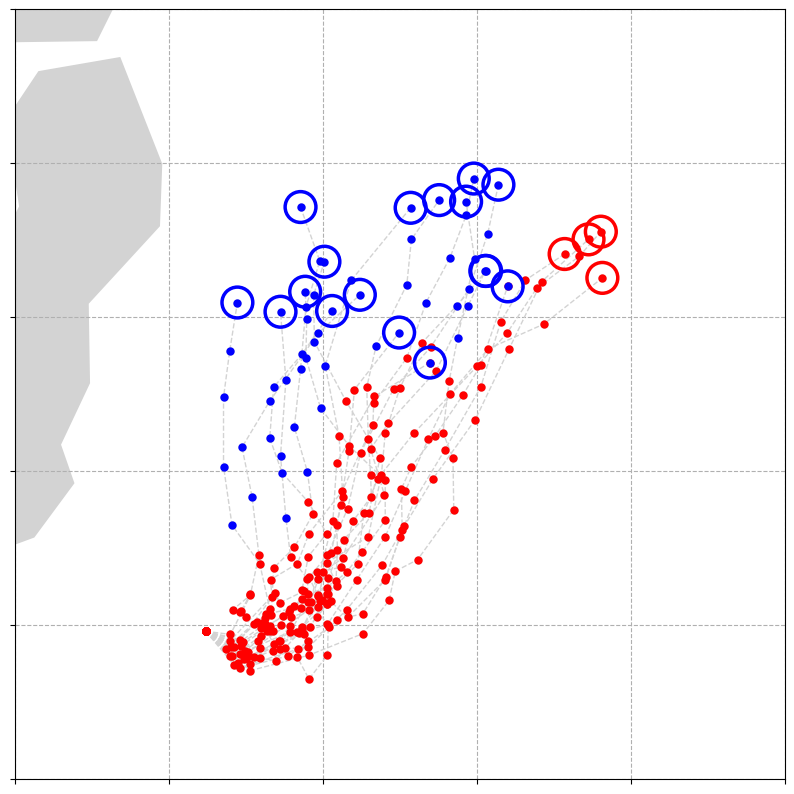

eps_threshold = 0.4


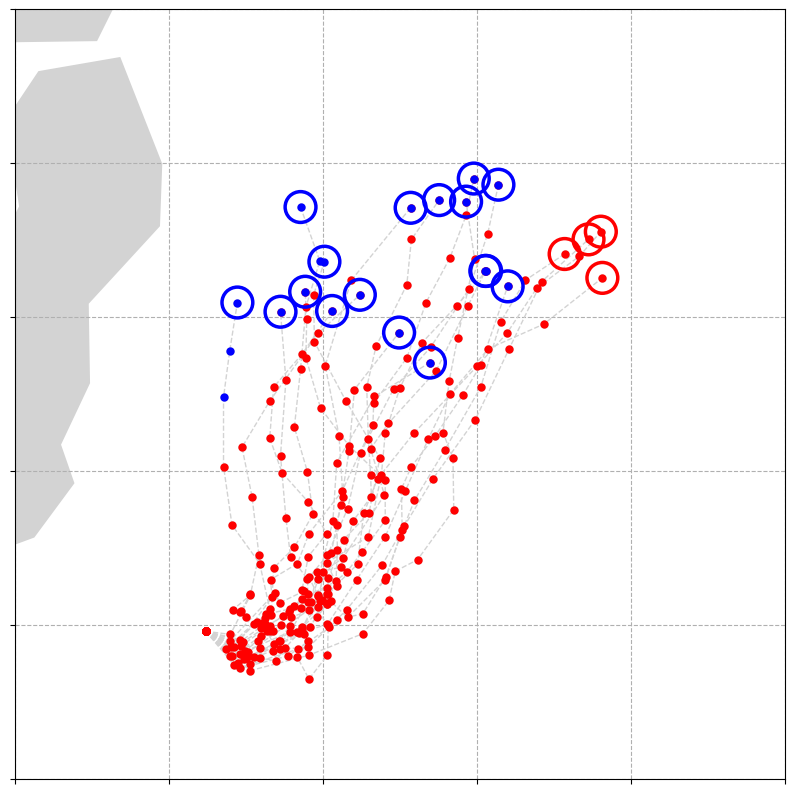

eps_threshold = 0.5


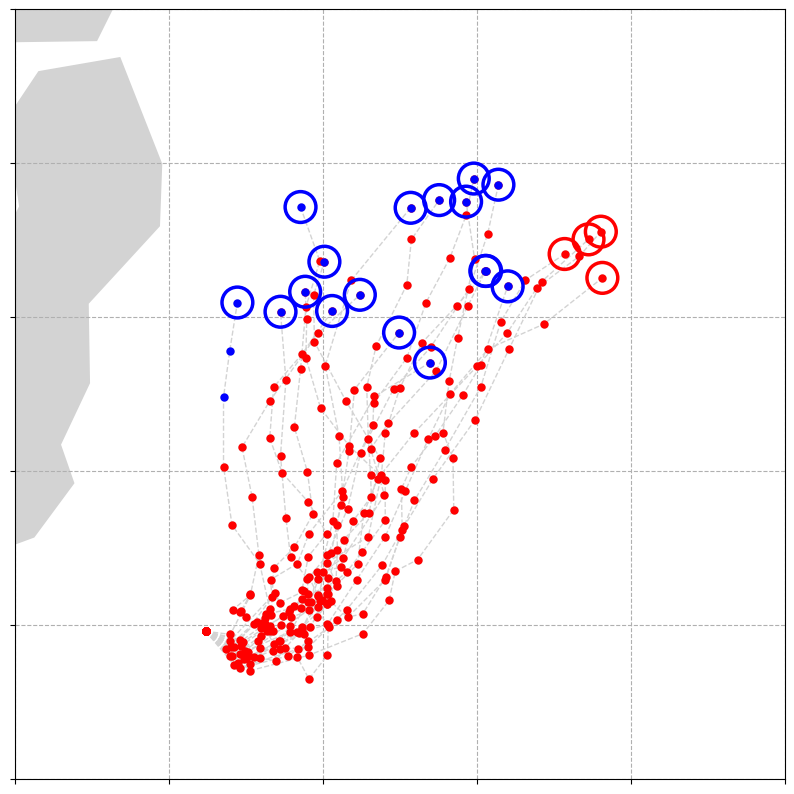

eps_threshold = 0.6000000000000001


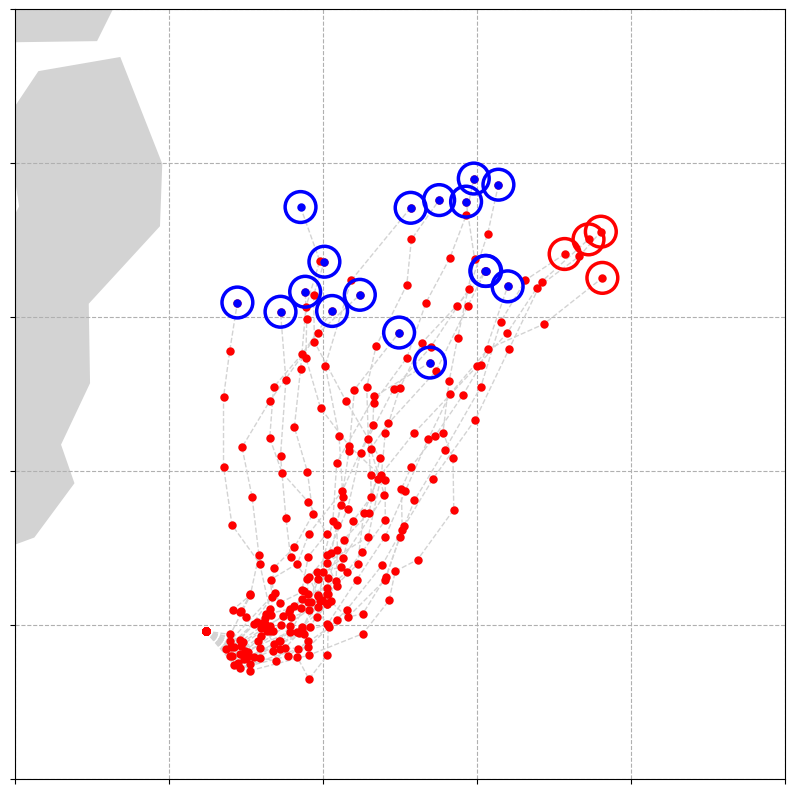

eps_threshold = 0.7000000000000001


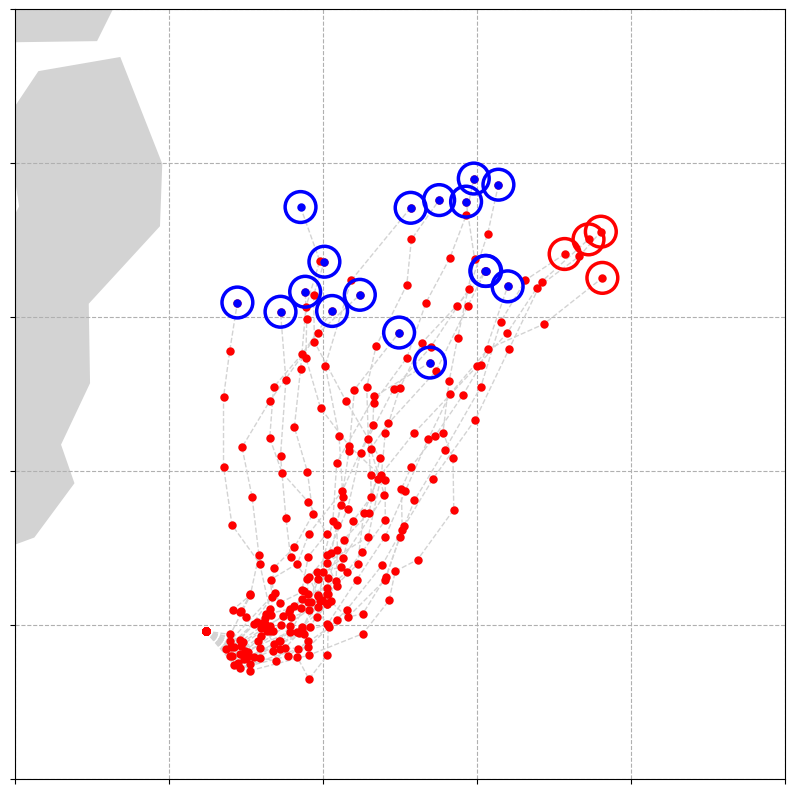

eps_threshold = 0.8


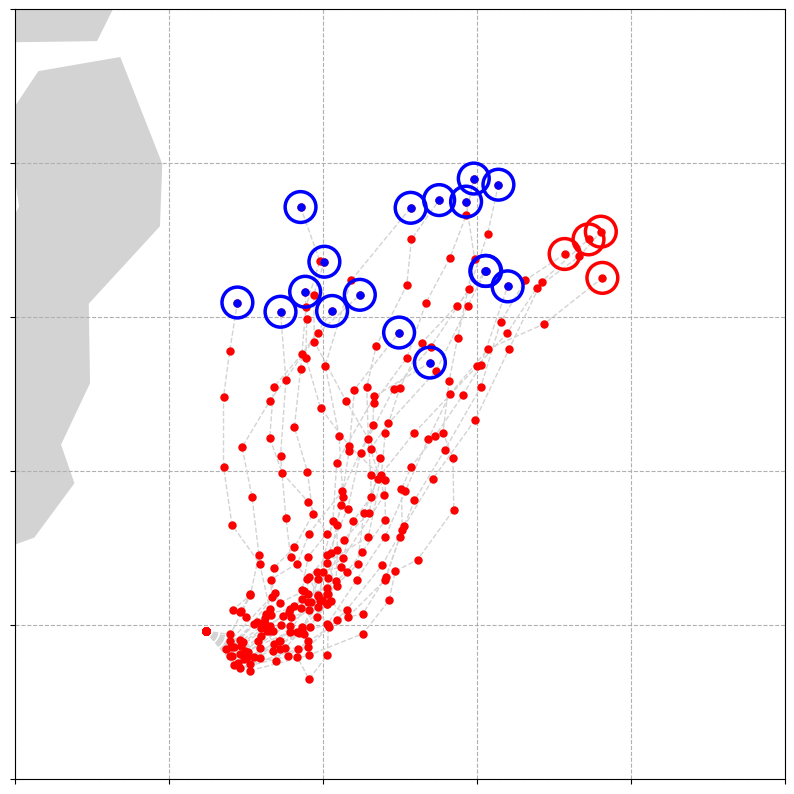

eps_threshold = 0.9


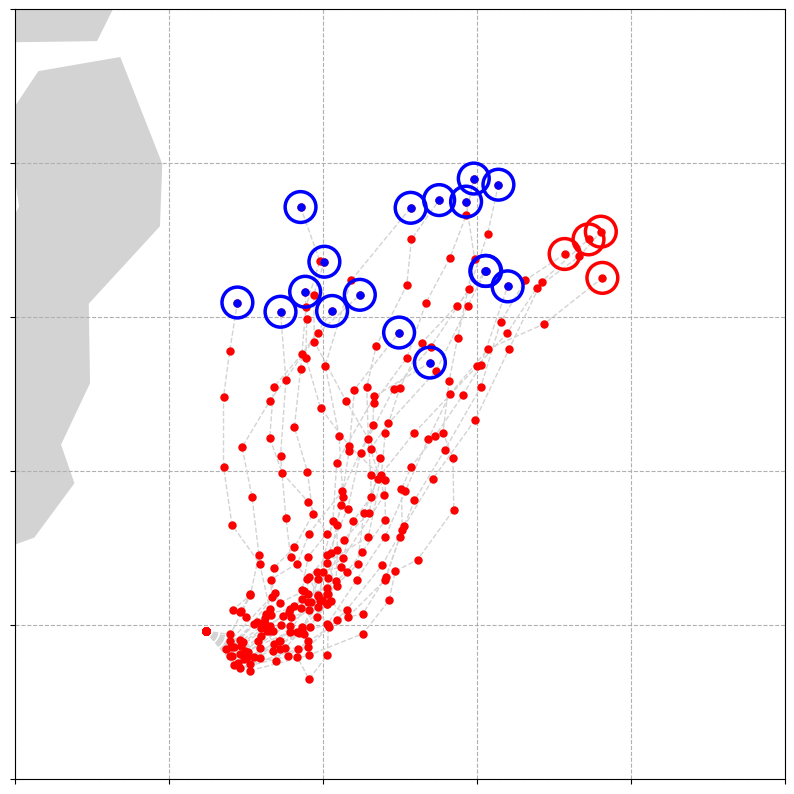

eps_threshold = 1.0


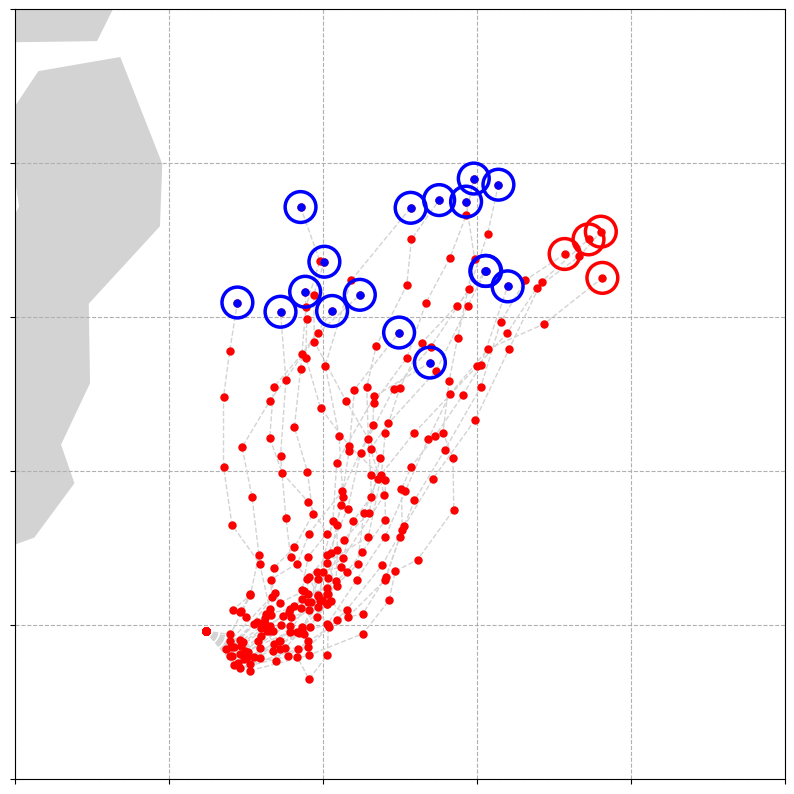

In [59]:
eps_thresholds = np.arange(0, 1.05, 0.1)
for eps_threshold in eps_thresholds:
    print(f"eps_threshold = {eps_threshold}")
    plot_attracting_basin(df_selected, eps_selected, good_cluster="Good", bad_cluster="Bad", eps_threshold=eps_threshold,
                       save_filename=f"outputs/Dolphine_eps_attracting_basin_{eps_threshold:.2f}.png",
                       lon_lim=[140,150], lat_lim=[32,42])

## Compute $\varepsilon_\Sigma$-attracting basin

In [61]:
eps_sum_selected = {}
eps_sum_selected["Good"] = eps_sum_attracting_basin(df_selected, distance_matrix_selected, target_cluster = "Good")
eps_sum_selected["Bad"] = eps_sum_attracting_basin(df_selected, distance_matrix_selected, target_cluster = "Bad")

## Plot $\varepsilon_\Sigma$-attracting basins for good and bad clusters

eps_threshold = 0.0


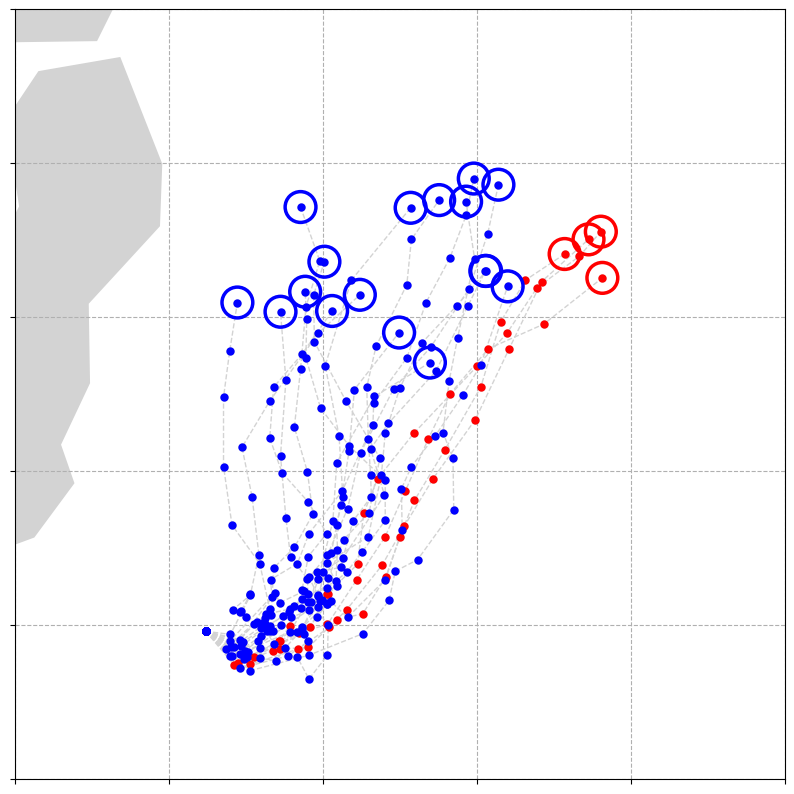

eps_threshold = 0.2


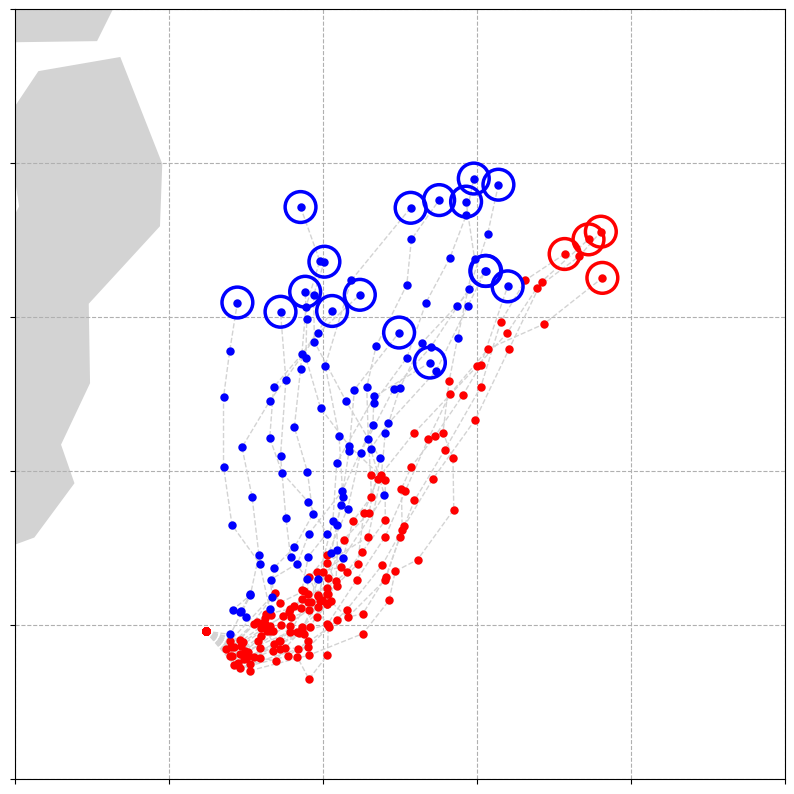

eps_threshold = 0.4


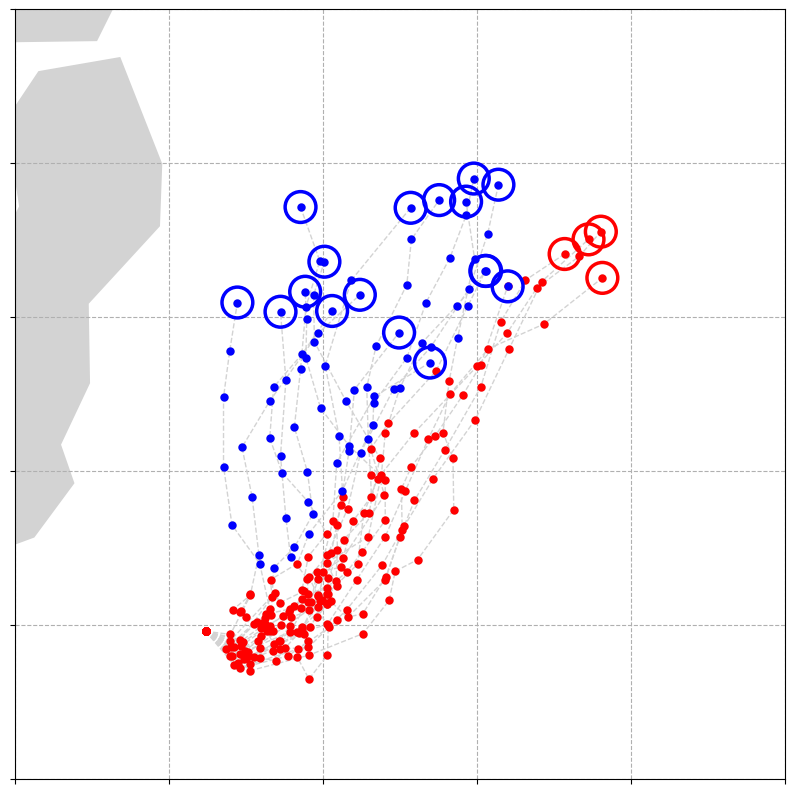

eps_threshold = 0.6000000000000001


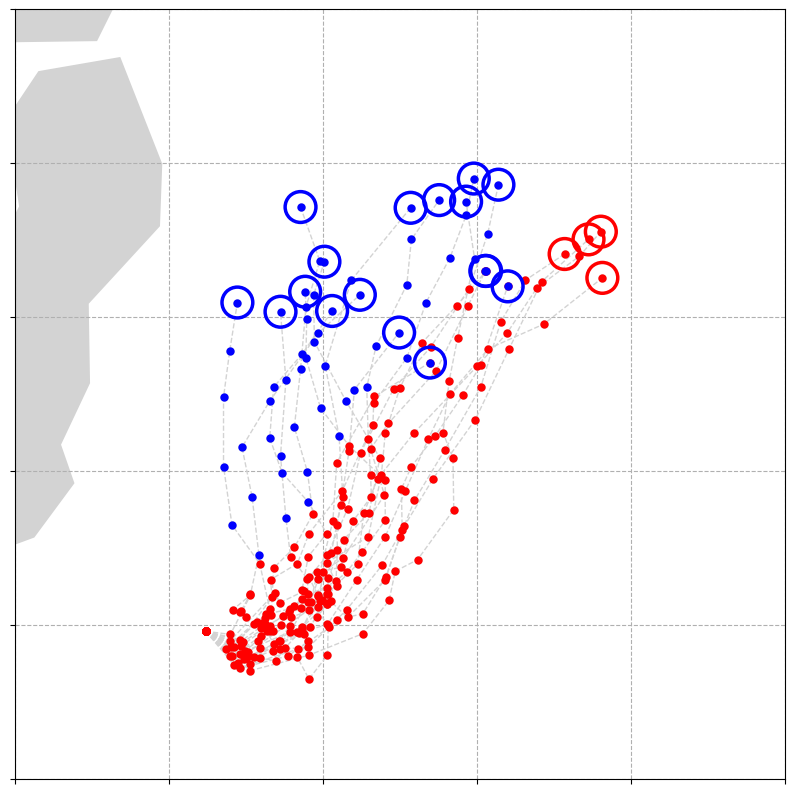

eps_threshold = 0.8


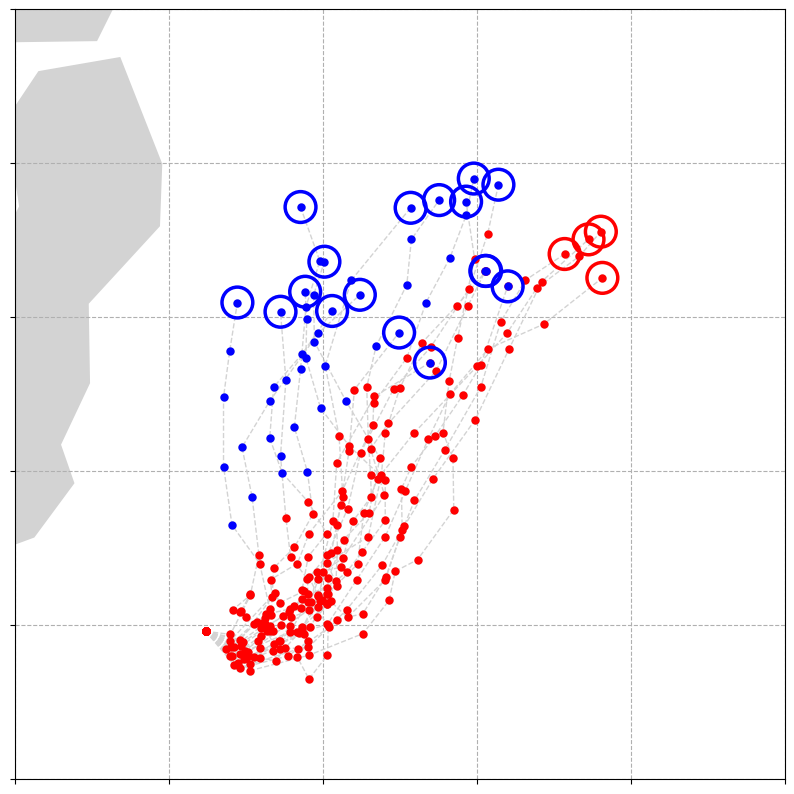

eps_threshold = 1.0


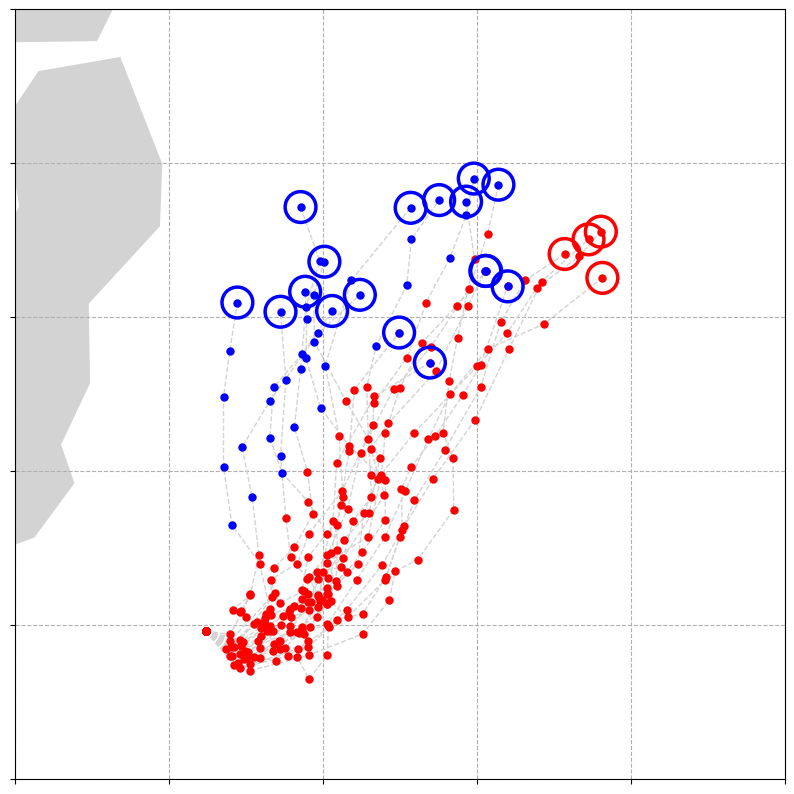

eps_threshold = 1.2000000000000002


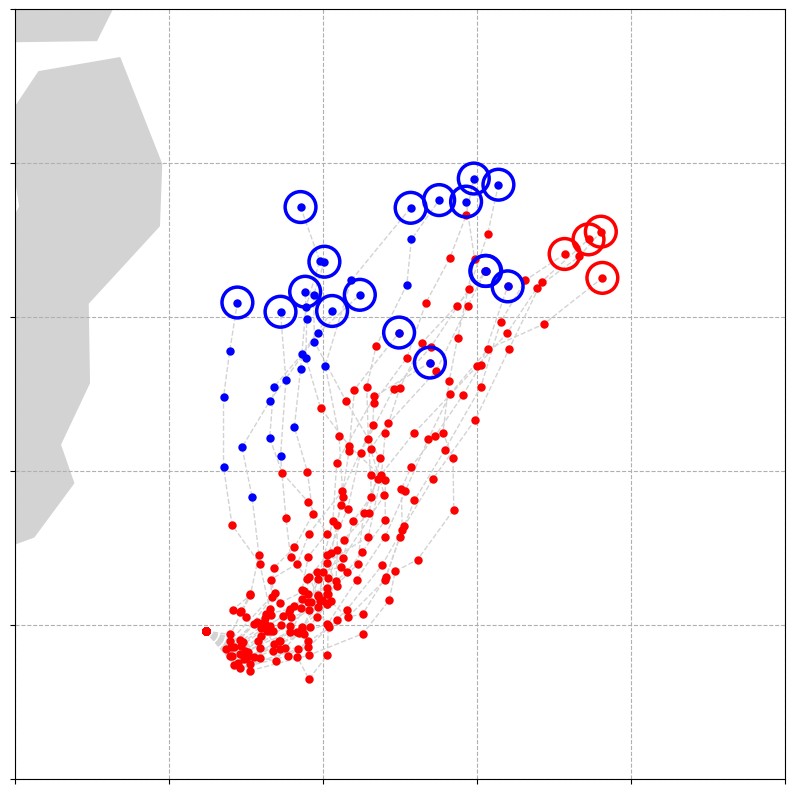

eps_threshold = 1.4000000000000001


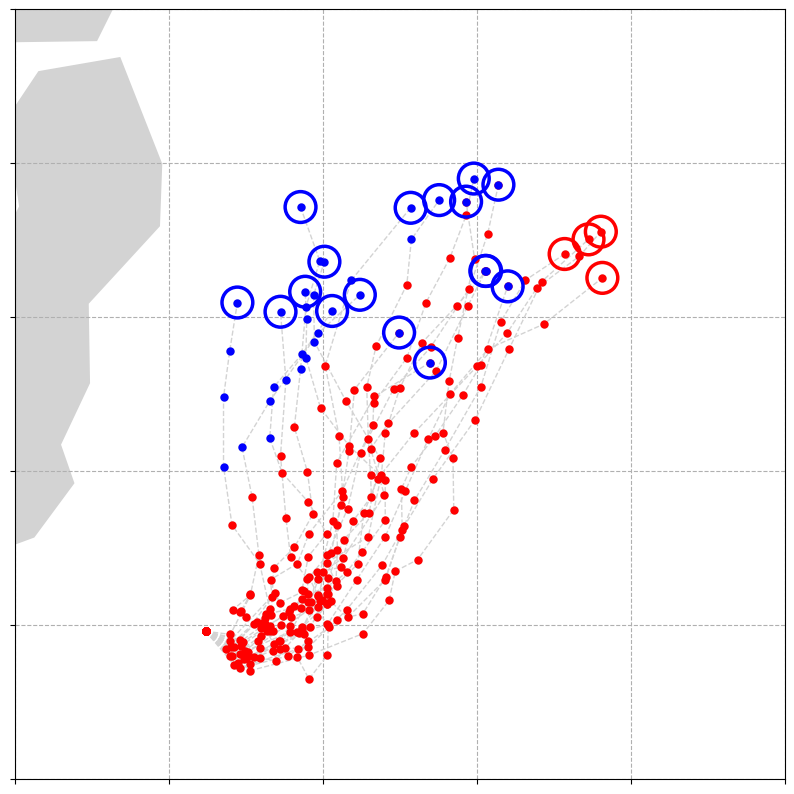

eps_threshold = 1.6


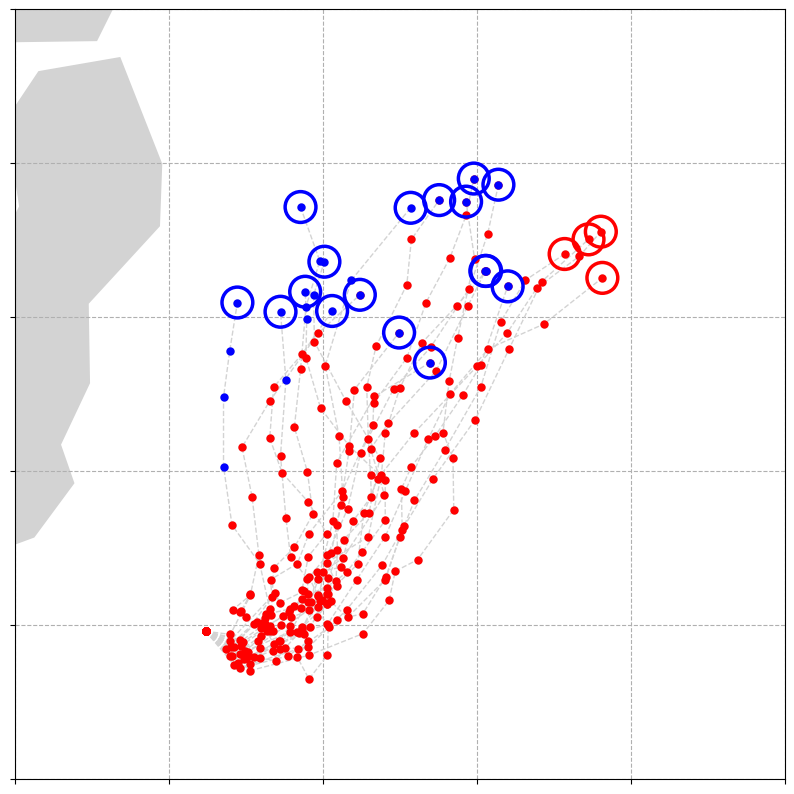

eps_threshold = 1.8


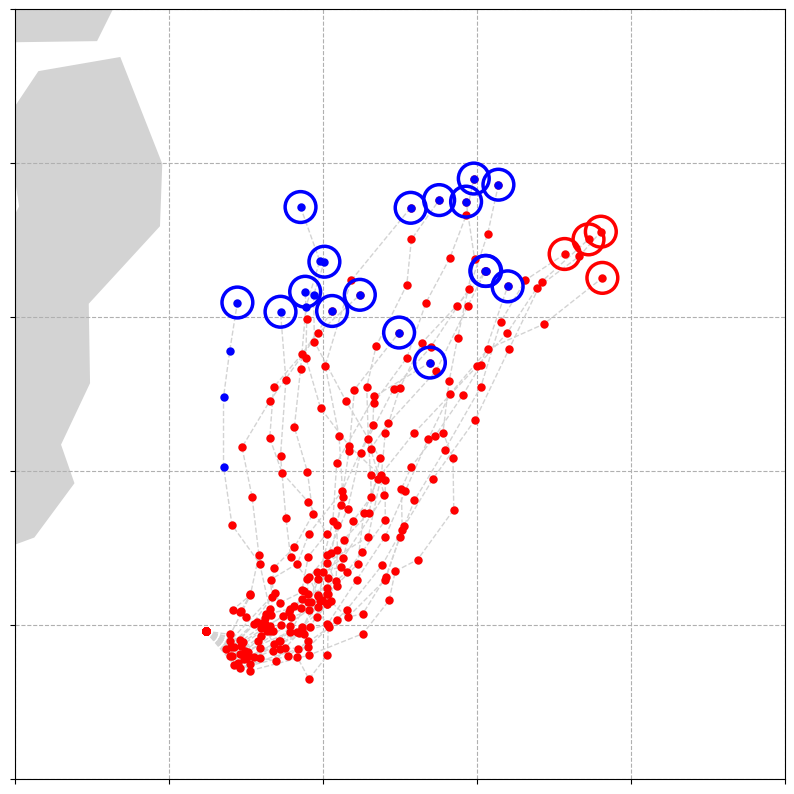

eps_threshold = 2.0


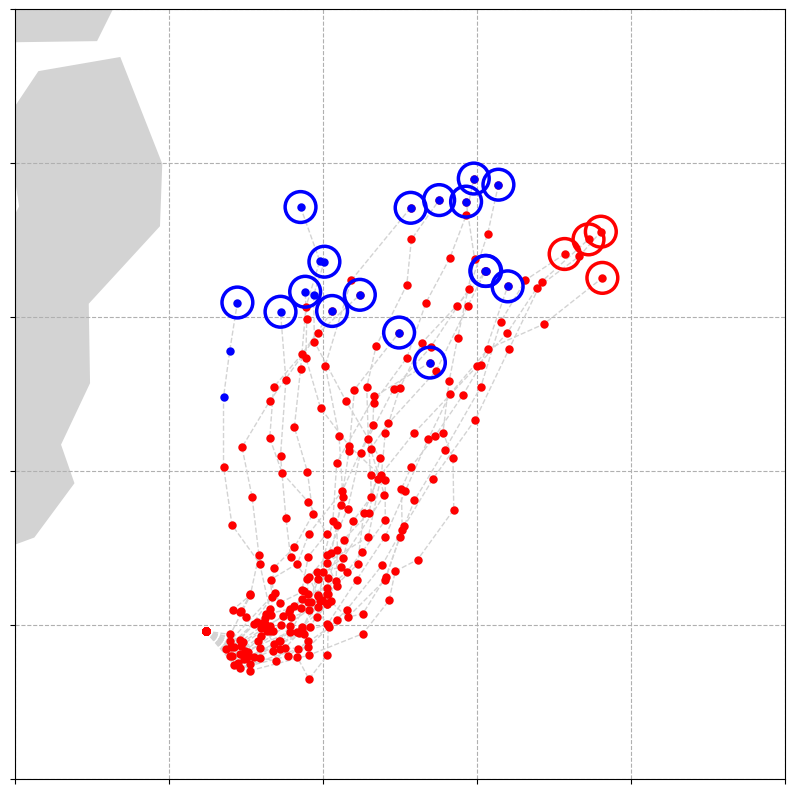

eps_threshold = 2.2


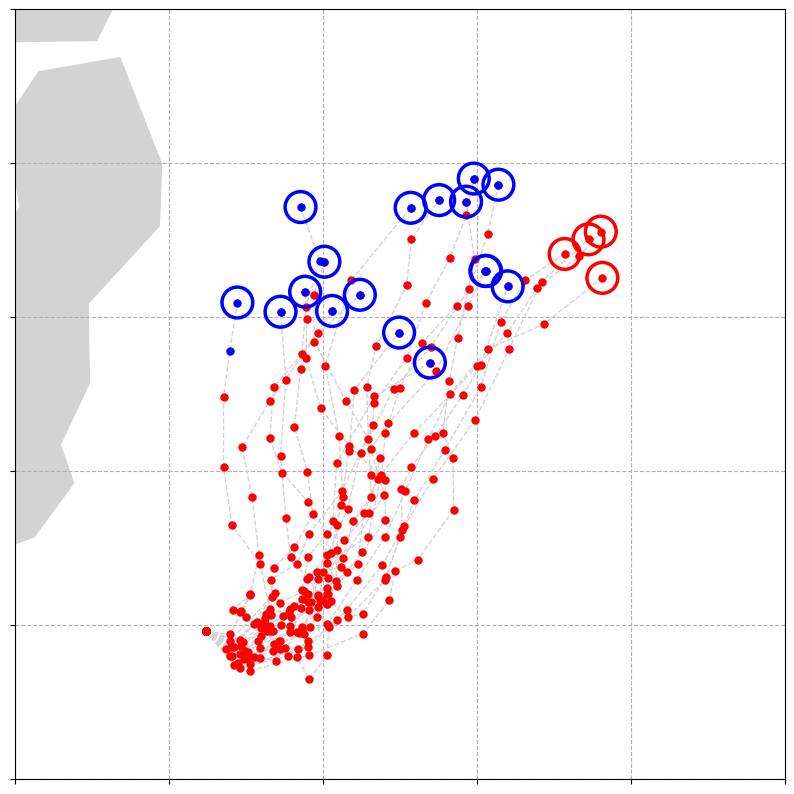

eps_threshold = 2.4000000000000004


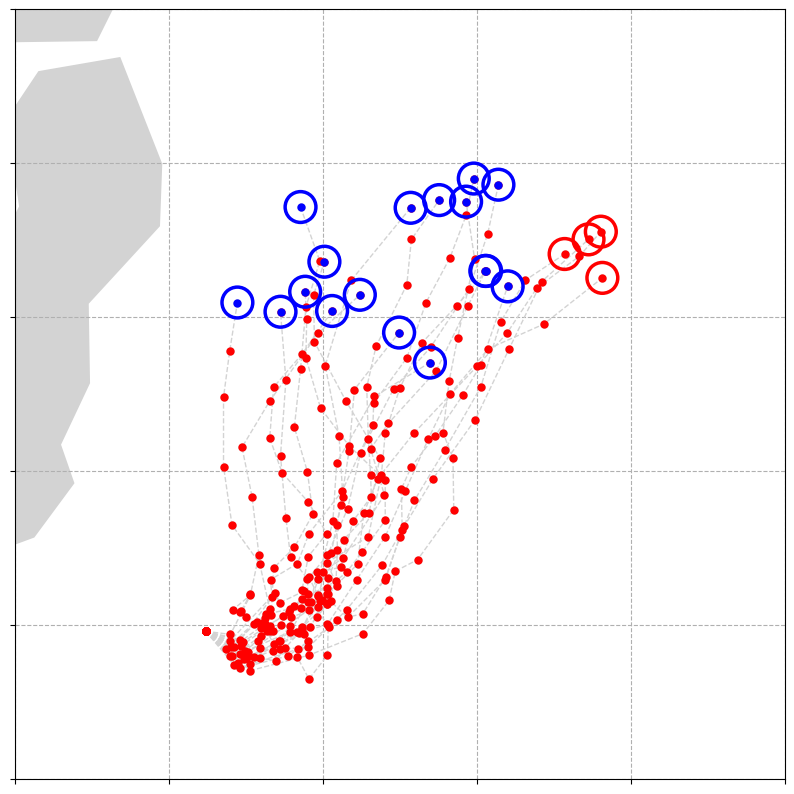

eps_threshold = 2.6


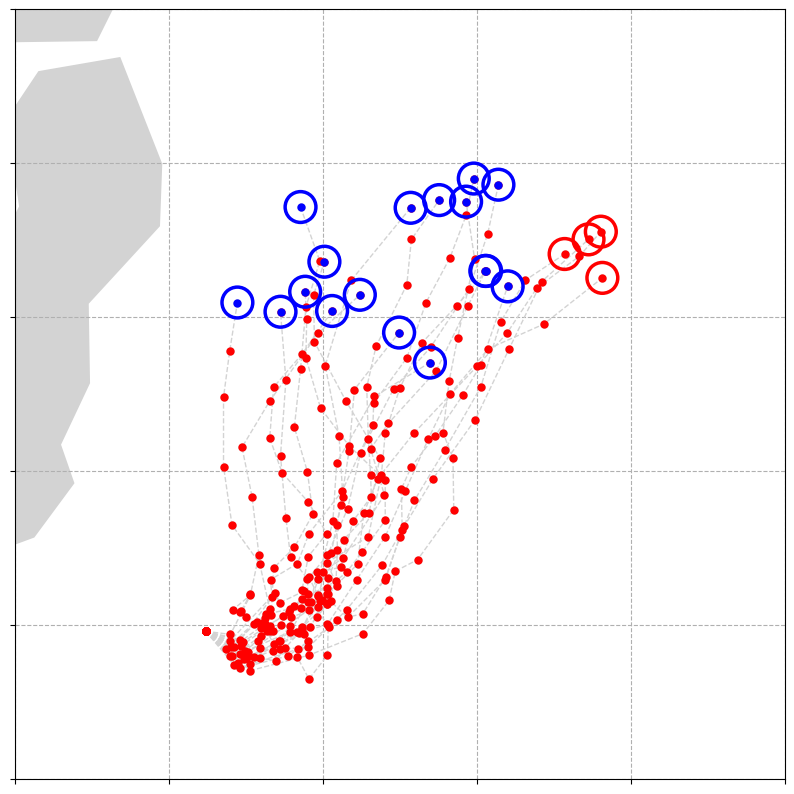

eps_threshold = 2.8000000000000003


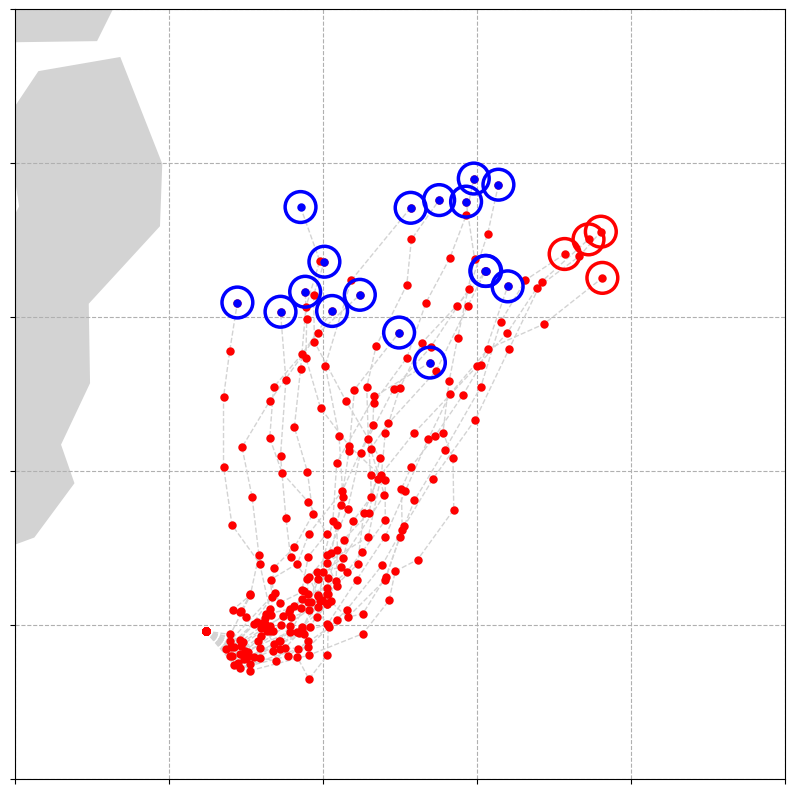

eps_threshold = 3.0


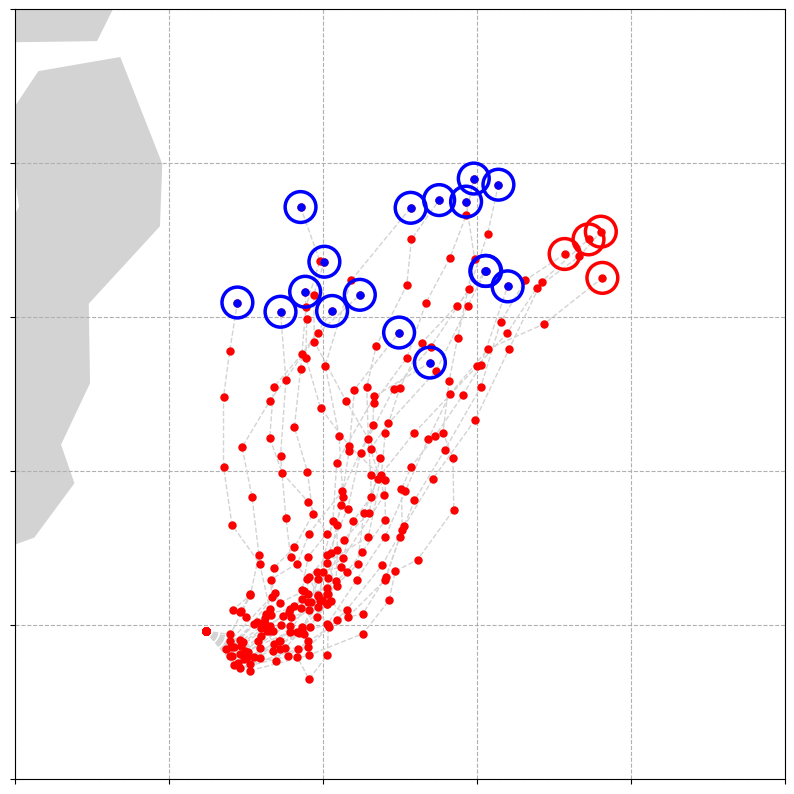

In [64]:
eps_thresholds = np.arange(0, 3.05, 0.2)
for eps_threshold in eps_thresholds:
    print(f"eps_threshold = {eps_threshold}")
    plot_attracting_basin(df_selected, eps_sum_selected, good_cluster="Good", bad_cluster="Bad", eps_threshold=eps_threshold,
                       save_filename=f"outputs/Dolphine_eps_sum_attracting_basin_{eps_threshold:.2f}.png",
                       lon_lim=[140,150], lat_lim=[32,42])

# Numerical experiments with whole ensamble weather forecasted data

## K-means clustering

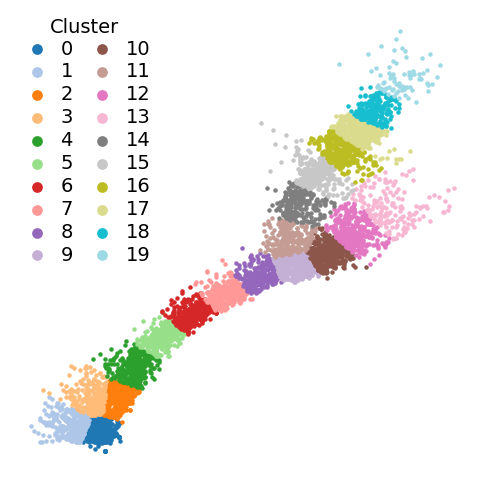

In [73]:
n_clusters = 20

kmeans = KMeans(n_clusters=n_clusters, random_state=0)
df_input['cluster'] = kmeans.fit_predict(df_input[['lon', 'lat']])

cluster_means = df_input.groupby('cluster')['lat'].mean().sort_values()
cluster_map = {old: new for new, old in enumerate(cluster_means.index)}
df_input['cluster'] = df_input['cluster'].map(cluster_map)

plt.figure(figsize=(6, 6))
cmap = plt.get_cmap('tab20')
for cluster_id in sorted(df_input['cluster'].unique()):
    mask = df_input['cluster'] == cluster_id
    plt.scatter(df_input.loc[mask, 'lon'], df_input.loc[mask, 'lat'], 
                s=5, c=[cmap(cluster_id % 20)], label=f'{cluster_id}')
legend = plt.legend(
    title='Cluster',
    bbox_to_anchor=(0.0, 1),
    loc='upper left',
    borderaxespad=0.,
    ncol=2,
    markerscale=3,
    frameon=False,
    fontsize=14,
    title_fontsize=14,  # タイトルのフォントサイズを大きく
    handletextpad=0.2,   # マーカーとテキストの間隔を狭く
    columnspacing=0.5,    # 列間のスペースを狭く
    labelspacing=0.2,
)
legend._legend_box.sep = 2 
plt.axis("off")
plt.savefig(f"outputs/Dolphine_clusters.png", bbox_inches="tight")
plt.show()

## Conpute distance (cost) matrix

In [74]:
distance_matrix = pairwise_distances(df_input[['lon', 'lat']])

## Compute $\varepsilon$-attracting basin

In [82]:
good_cluster = 13
bad_cluster = 19

eps = {}
eps[good_cluster] = eps_attracting_basin(df_input, distance_matrix, good_cluster)
eps[bad_cluster] = eps_attracting_basin(df_input, distance_matrix, bad_cluster)

## Compute $\varepsilon_\Sigma$-attracting basin

In [76]:
eps_sum = {}
eps_sum[good_cluster] = eps_sum_attracting_basin(df_input, distance_matrix, good_cluster)
eps_sum[bad_cluster] = eps_sum_attracting_basin(df_input, distance_matrix, bad_cluster)

## Sublevel set visualization of $\varepsilon$-attracting basin

/tmp/ipykernel_336868/3481577888.py:23: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  areas = 0.5 * np.abs(np.cross(tri_pts[:,1] - tri_pts[:,0], tri_pts[:,2] - tri_pts[:,0]))


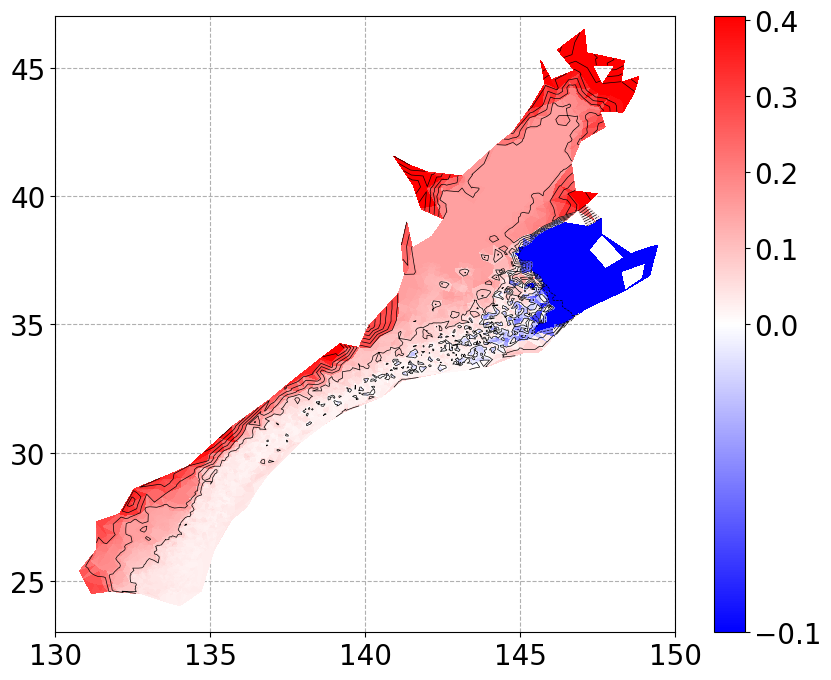

/tmp/ipykernel_336868/3481577888.py:23: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  areas = 0.5 * np.abs(np.cross(tri_pts[:,1] - tri_pts[:,0], tri_pts[:,2] - tri_pts[:,0]))


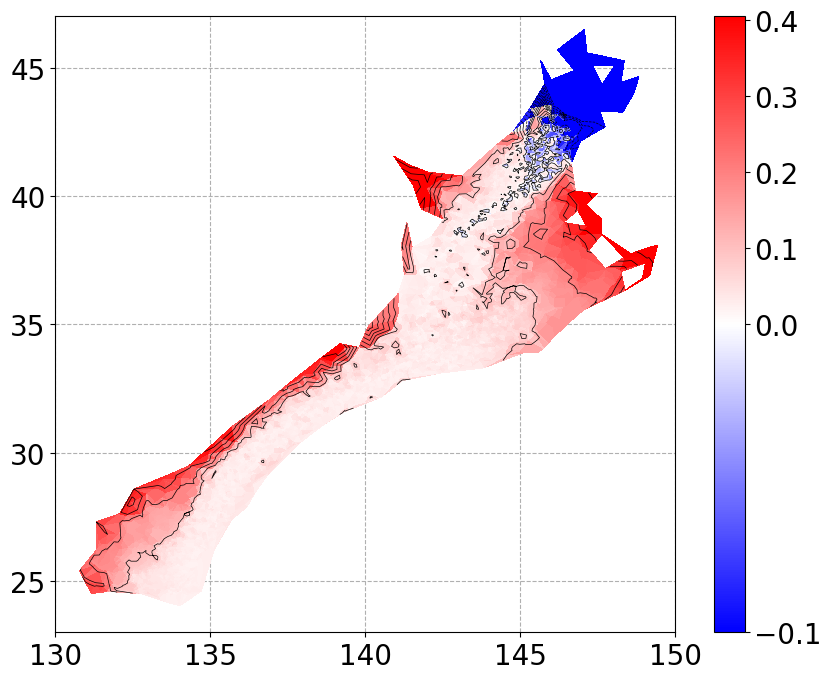

In [109]:
sublevel_set_visualization(points = df_input[['lon', 'lat']].values, colors = eps[good_cluster],
                 save_filename=f"outputs/Dolphine_eps_attracting_basin_{good_cluster}.png",
                 vmin=-0.1, vmax=0.405)

sublevel_set_visualization(points = df_input[['lon', 'lat']].values, colors = eps[bad_cluster],
                 save_filename=f"outputs/Dolphine_eps_attracting_basin_{bad_cluster}.png",
                 vmin=-0.1, vmax=0.405)

## Sublevel set visualization of $\varepsilon_\Sigma$-attracting basin

/tmp/ipykernel_336868/365255186.py:23: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  areas = 0.5 * np.abs(np.cross(tri_pts[:,1] - tri_pts[:,0], tri_pts[:,2] - tri_pts[:,0]))


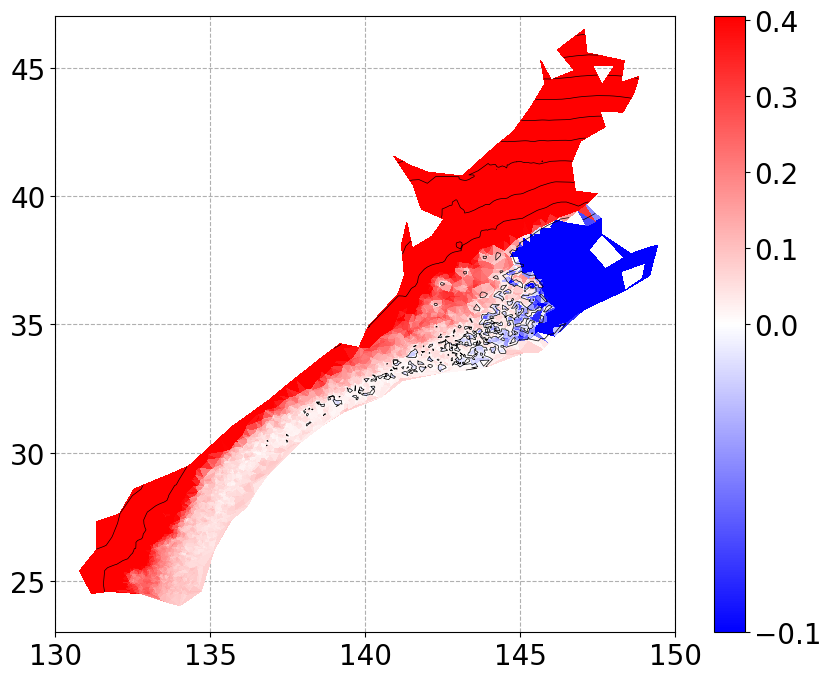

/tmp/ipykernel_336868/365255186.py:23: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  areas = 0.5 * np.abs(np.cross(tri_pts[:,1] - tri_pts[:,0], tri_pts[:,2] - tri_pts[:,0]))


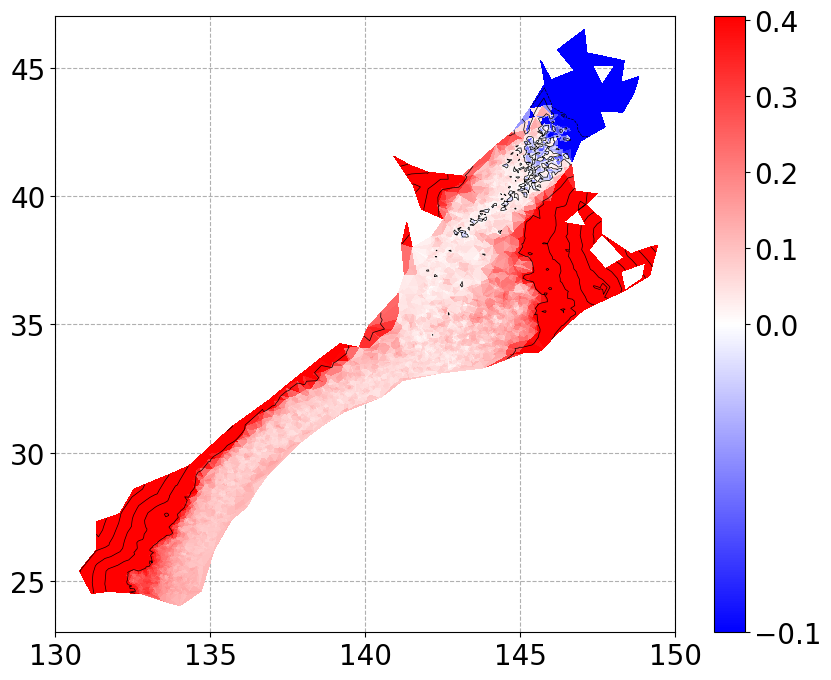

In [84]:
sublevel_set_visualization(points = df_input[['lon', 'lat']].values, colors = eps_sum[good_cluster],
                 save_filename=f"outputs/Dolphine_eps_sum_attracting_basin_{good_cluster}.png",
                 vmin=-0.1, vmax=0.405)

sublevel_set_visualization(points = df_input[['lon', 'lat']].values, colors = eps_sum[bad_cluster],
                 save_filename=f"outputs/Dolphine_eps_sum_attracting_basin_{bad_cluster}.png",
                 vmin=-0.1, vmax=0.405)